This notebook contains the source code for the images shown in the paper. 
It is not meant for re-runnnig everything since requires model checkpoints. 

In [ ]:
!pip install cma

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 328.3/328.3 kB 24.8 MB/s eta 0:00:00


In [ ]:
!rm -rf org && git clone --filter=blob:none --sparse https://github.com/yugoguy/org.git
!cd org && git sparse-checkout set dev/SSLVE && git checkout Latent-Variable-Evolution
import sys, os, glob
sys.path.insert(0, 'org/dev/SSLVE')
for f in sorted(glob.glob('org/dev/SSLVE/*.py')):
    print(f"Running: {f}")
    %run {f}

Cloning into 'org'...
remote: Enumerating objects: 1903, done.
remote: Counting objects: 100% (222/222), done.
remote: Compressing objects: 100% (177/177), done.
remote: Total 1903 (delta 144), reused 47 (delta 42), pack-reused 1681 (from 1)
Receiving objects: 100% (1903/1903), 531.72 KiB | 29.54 MiB/s, done.
Resolving deltas: 100% (803/803), done.
remote: Enumerating objects: 1, done.
remote: Total 1 (delta 0), reused 0 (delta 0), pack-reused 1 (from 1)
Receiving objects: 100% (1/1), 255 bytes | 255.00 KiB/s, done.
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 18 (delta 5), reused 1 (delta 1), pack-reused 6 (from 1)
Receiving objects: 100% (18/18), 72.87 KiB | 10.41 MiB/s, done.
Resolving deltas: 100% (6/6), done.
Branch 'Latent-Variable-Evolution' set up to track remote branch 'Latent-Variable-Evolution' from 'origin'.
Switched to a new branch 'Latent-Variable-Evolution'
Running: org

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Ant Experiment Analysis

In [ ]:
#@title AntGait Results Table
import os
import numpy as np
from collections import defaultdict

ARCHIVE_DIR = './'  #@param {type:"string"}

results = defaultdict(lambda: {'qd': [], 'cov': [], 'f_mean': [], 'f_min': []})

for d in sorted(os.listdir(ARCHIVE_DIR)):
    history_path = os.path.join(ARCHIVE_DIR, d, 'history.npy')
    if not os.path.exists(history_path):
        continue
    parts = d.rsplit('_seed', 1)
    if len(parts) != 2:
        continue
    exp_name = parts[0]

    history = np.load(history_path, allow_pickle=True).item()
    if 'qd_score' in history and len(history['qd_score']) > 0:
        results[exp_name]['qd'].append(history['qd_score'][-1])
    if 'coverage' in history and len(history['coverage']) > 0:
        results[exp_name]['cov'].append(history['coverage'][-1])
    if 'fitness_mean' in history and len(history['fitness_mean']) > 0:
        results[exp_name]['f_mean'].append(history['fitness_mean'][-1])
    if 'fitness_min' in history and len(history['fitness_min']) > 0:
        results[exp_name]['f_min'].append(history['fitness_min'][-1])

if not results:
    print("No results found.")
else:
    header = f"{'Method':<25} {'N':>3} {'QD mean':>12} {'Cov% mean':>12} {'Fit mean':>12} {'Best Fit':>12}"
    print(header)
    print('-' * len(header))
    for name in sorted(results):
        r = results[name]
        n = len(r['qd'])
        qd_mean = np.mean(r['qd'])
        cov_mean = np.mean(r['cov']) * 100
        f_mean = np.mean(r['f_mean'])
        f_min = np.mean(r['f_min'])
        print(f"{name:<25} {n:>3} {qd_mean:>12.2f} {cov_mean:>12.2f} {f_mean:>12.4f} {f_min:>12.4f}")

Method                      N      QD mean    Cov% mean     Fit mean     Best Fit
---------------------------------------------------------------------------------
LVE                         2   3240997.28        60.89     -27.6416    -284.9996
LVE-Proposed                2   3253791.23        60.84     -29.7989    -341.8861


In [ ]:
#@title AntGait Results Table
import os
import numpy as np
from collections import defaultdict

ARCHIVE_DIR = './'  #@param {type:"string"}

results = defaultdict(lambda: {'qd': [], 'cov': []})

for d in sorted(os.listdir(ARCHIVE_DIR)):
    history_path = os.path.join(ARCHIVE_DIR, d, 'history.npy')
    if not os.path.exists(history_path):
        continue
    # Split off _seed{N}
    parts = d.rsplit('_seed', 1)
    if len(parts) != 2:
        continue
    exp_name = parts[0]

    history = np.load(history_path, allow_pickle=True).item()
    if 'qd_score' in history and len(history['qd_score']) > 0:
        results[exp_name]['qd'].append(history['qd_score'][-1])
    if 'coverage' in history and len(history['coverage']) > 0:
        results[exp_name]['cov'].append(history['coverage'][-1])

if not results:
    print("No results found.")
else:
    header = f"{'Method':<25} {'N':>3} {'QD mean':>12} {'QD std':>12} {'Cov% mean':>12} {'Cov% std':>12}"
    print(header)
    print('-' * len(header))
    for name in sorted(results):
        r = results[name]
        n = len(r['qd'])
        qd_mean = np.mean(r['qd'])
        qd_std = np.std(r['qd'])
        cov_mean = np.mean(r['cov']) * 100
        cov_std = np.std(r['cov']) * 100
        print(f"{name:<25} {n:>3} {qd_mean:>12.2f} {qd_std:>12.2f} {cov_mean:>12.2f} {cov_std:>12.2f}")

Method                      N      QD mean       QD std    Cov% mean     Cov% std
---------------------------------------------------------------------------------
LVE                         2   3240997.28     21742.67        60.89         0.31
LVE-Proposed                2   3253791.23       591.36        60.84         0.24


In [ ]:
#@title Ant Gait Baseline Results
import os
import numpy as np
from collections import defaultdict

BASE_DIR = './'

METHODS = {
    'MAP-Elites (Mut)': [
        BASE_DIR + 'Ant_MAPElite_GaussianMut/MAPElite_Gauss_sigma0.05_seed42/',
        BASE_DIR + 'Ant_MAPElite_GaussianMut/MAPElite_Gauss_sigma0.05_seed123/',
    ],
    'MAP-Elites (Mut+Line)': [
        BASE_DIR + 'Ant_MAPElite_GaussLine_BoltzMix/MAPElite_GaussLine_BoltzMix_seed42/',
        BASE_DIR + 'Ant_MAPElite_GaussLine_BoltzMix/MAPElite_GaussLine_BoltzMix_seed123/',
    ],
    'CMA-ME': [
        BASE_DIR + 'Ant_CMAME/CMAME_emit10_pop50_sigma0.05_seed42/',
        BASE_DIR + 'Ant_CMAME/CMAME_emit10_pop50_sigma0.05_seed123/',
    ],
}

header = f"{'Method':<25} {'N':>3} {'QD mean':>12} {'QD std':>12} {'Cov% mean':>12} {'Cov% std':>12} {'Fit mean':>12} {'Best Fit':>12}"
print(header)
print('-' * len(header))

for name, paths in METHODS.items():
    qd_scores = []
    coverages = []
    f_means = []
    f_mins = []

    for path in paths:
        history_path = path + 'history.npy'
        if not os.path.exists(history_path):
            print(f"  MISSING: {history_path}")
            continue
        history = np.load(history_path, allow_pickle=True).item()
        if 'qd_score' in history and len(history['qd_score']) > 0:
            qd_scores.append(history['qd_score'][-1])
        if 'coverage' in history and len(history['coverage']) > 0:
            coverages.append(history['coverage'][-1])
        if 'fitness_mean' in history and len(history['fitness_mean']) > 0:
            f_means.append(history['fitness_mean'][-1])
        if 'fitness_min' in history and len(history['fitness_min']) > 0:
            f_mins.append(history['fitness_min'][-1])

    if qd_scores:
        print(f"{name:<25} {len(qd_scores):>3} {np.mean(qd_scores):>12.2f} {np.std(qd_scores):>12.2f} {np.mean(coverages)*100:>12.2f} {np.std(coverages)*100:>12.2f} {np.mean(f_means):>12.4f} {np.mean(f_mins):>12.4f}")
    else:
        print(f"{name:<25}   NO DATA")

Method                      N      QD mean       QD std    Cov% mean     Cov% std     Fit mean     Best Fit
-----------------------------------------------------------------------------------------------------------
MAP-Elites (Mut)            2   2839558.69     65413.41        53.34         1.29     -32.3143    -328.6934
MAP-Elites (Mut+Line)       2   3003907.45     29360.56        57.27         0.59     -24.4733    -267.2259
CMA-ME                      2   2748618.34     14752.13        51.30         0.27     -35.7403    -341.3280


LVE: 6058 bins, latent dim 64
LVE + BehavePred: 6108 bins, latent dim 64

--- PCA ---


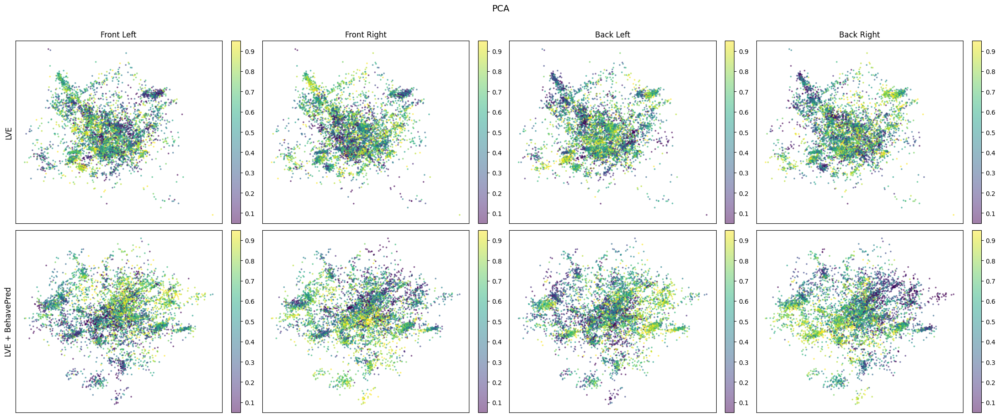


--- t-SNE ---


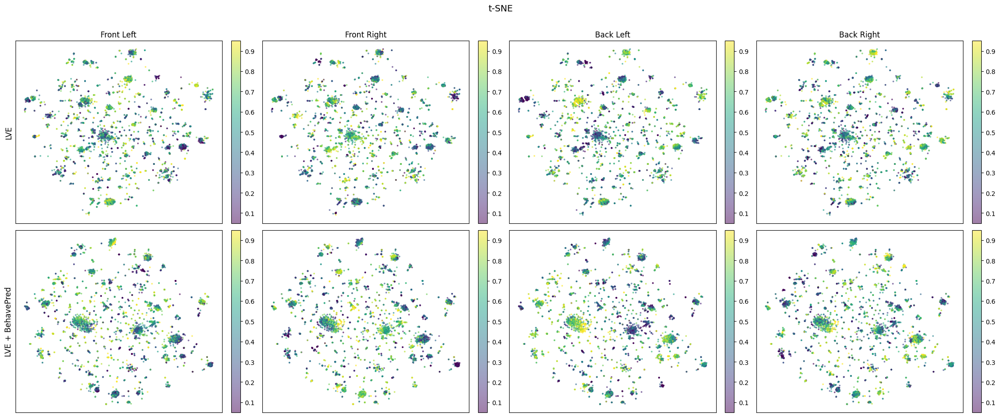


--- UMAP ---


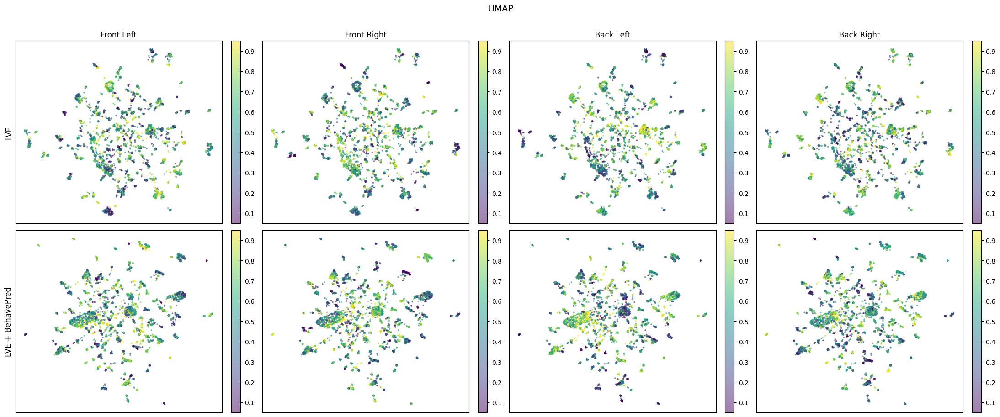

In [ ]:
#@title AntGait Latent Space Analysis (2x4 layout)
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

ARCHIVE_DIR = './'  #@param {type:"string"}
NAME_A = 'LVE_seed123'  #@param {type:"string"}
NAME_B = 'LVE-Proposed_seed123'  #@param {type:"string"}
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE + BehavePred'  #@param {type:"string"}

ARCHITECTURE = [27, 64, 64, 8]  #@param
BIN_SIZES = [10, 10, 10, 10]  #@param

LATENT_DIM_A = 64  #@param {type:"integer"}
HIDDEN_DIMS_A = [256]  #@param
LATENT_DIM_B = 64  #@param {type:"integer"}
HIDDEN_DIMS_B = [256]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BD_DIM = 4
FOOT_LABELS = ['Front Left', 'Front Right', 'Back Left', 'Back Right']

weight_dim = MLP_Agent(ARCHITECTURE, output_activation='tanh').get_weight_dim()
bd = AntGaitBD(bin_sizes=BIN_SIZES)

PATH_A = ARCHIVE_DIR + NAME_A + '/'
PATH_B = ARCHIVE_DIR + NAME_B + '/'

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=weight_dim, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_2x4(z_a, z_b, bd_vals_a, bd_vals_b, z2_a, z2_b, method_name):
    """2 rows (LVE, LVE+BehavePred) x 4 cols (foot 0-3)"""
    fig, axes = plt.subplots(2, 4, figsize=(22, 9))
    for row, (z2, bd_vals, label) in enumerate([(z2_a, bd_vals_a, LABEL_A), (z2_b, bd_vals_b, LABEL_B)]):
        for col in range(BD_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, col], cmap='viridis', s=3, alpha=0.5)
            if row == 0:
                ax.set_title(FOOT_LABELS[col], fontsize=12)
            if col == 0:
                ax.set_ylabel(label, fontsize=12)
            ax.set_xticks([])
            ax.set_yticks([])
            plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    fig.suptitle(method_name, fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(z_a)} bins, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(z_b)} bins, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
z2_a = PCA(n_components=2).fit_transform(z_a)
z2_b = PCA(n_components=2).fit_transform(z_b)
plot_2x4(z_a, z_b, bd_vals_a, bd_vals_b, z2_a, z2_b, "PCA")

print("\n--- t-SNE ---")
z2_a = TSNE(n_components=2, perplexity=200, random_state=42).fit_transform(z_a[:5000] if len(z_a) > 5000 else z_a)
z2_b = TSNE(n_components=2, perplexity=200, random_state=42).fit_transform(z_b[:5000] if len(z_b) > 5000 else z_b)
bd_sub_a = bd_vals_a[:5000] if len(bd_vals_a) > 5000 else bd_vals_a
bd_sub_b = bd_vals_b[:5000] if len(bd_vals_b) > 5000 else bd_vals_b
plot_2x4(z_a, z_b, bd_sub_a, bd_sub_b, z2_a, z2_b, "t-SNE")

print("\n--- UMAP ---")
reducer_a = umap.UMAP(n_components=2, n_neighbors=200, min_dist=0.3)
reducer_b = umap.UMAP(n_components=2, n_neighbors=200, min_dist=0.3)
z2_a = reducer_a.fit_transform(z_a[:5000] if len(z_a) > 5000 else z_a)
z2_b = reducer_b.fit_transform(z_b[:5000] if len(z_b) > 5000 else z_b)
bd_sub_a = bd_vals_a[:5000] if len(bd_vals_a) > 5000 else bd_vals_a
bd_sub_b = bd_vals_b[:5000] if len(bd_vals_b) > 5000 else bd_vals_b
plot_2x4(z_a, z_b, bd_sub_a, bd_sub_b, z2_a, z2_b, "UMAP")

In [ ]:
#@title Latent-BD Distance Correlation
import numpy as np
import torch
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr, pearsonr

ARCHIVE_DIR = './'  #@param {type:"string"}
NAMES = ['LVE_seed123', 'LVE-Proposed_seed123']  #@param
LABELS = ['LVE', 'LVE + BehavePred']  #@param

ARCHITECTURE = [27, 64, 64, 8]  #@param
BIN_SIZES = [10, 10, 10, 10]  #@param
LATENT_DIMS = [64, 64]  #@param
HIDDEN_DIMS_LIST = [[256], [256]]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

weight_dim = MLP_Agent(ARCHITECTURE, output_activation='tanh').get_weight_dim()
bd = AntGaitBD(bin_sizes=BIN_SIZES)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=weight_dim, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

print(f"{'Method':<25} {'Spearman r':>12} {'Spearman p':>12} {'Pearson r':>12} {'Pearson p':>12}")
print('-' * 75)

for name, label, latent_dim, hidden_dims in zip(NAMES, LABELS, LATENT_DIMS, HIDDEN_DIMS_LIST):
    path = ARCHIVE_DIR + name + '/'
    lm, bm = load_model_and_archive(path, latent_dim, hidden_dims)

    best_indices = [bm.bins_idx[bid][0] for bid in bm.bins_idx]
    best_thetas = np.array([bm.dataset[i] for i in best_indices])
    best_bds = np.array([bd.bin_value(bid) for bid in bm.bins_idx])

    with torch.no_grad():
        z = lm.encode(torch.tensor(best_thetas, dtype=torch.float32).to(DEVICE)).cpu().numpy()

    z_dists = pdist(z, metric='euclidean')
    bd_dists = pdist(best_bds, metric='euclidean')

    sp_r, sp_p = spearmanr(z_dists, bd_dists)
    pe_r, pe_p = pearsonr(z_dists, bd_dists)

    print(f"{label:<25} {sp_r:>12.4f} {sp_p:>12.2e} {pe_r:>12.4f} {pe_p:>12.2e}")

Method                      Spearman r   Spearman p    Pearson r    Pearson p
---------------------------------------------------------------------------
LVE                             0.0862     0.00e+00       0.1110     0.00e+00
LVE + BehavePred                0.1974     0.00e+00       0.2100     0.00e+00


In [ ]:
#@title Latent-BD Distance Correlation
import numpy as np
import torch
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr, pearsonr

ARCHIVE_DIR = './'  #@param {type:"string"}
NAMES = ['LVE_seed42', 'LVE-Proposed_seed42']  #@param
LABELS = ['LVE', 'LVE + BehavePred']  #@param

ARCHITECTURE = [27, 64, 64, 8]  #@param
BIN_SIZES = [10, 10, 10, 10]  #@param
LATENT_DIMS = [64, 64]  #@param
HIDDEN_DIMS_LIST = [[256], [256]]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

weight_dim = MLP_Agent(ARCHITECTURE, output_activation='tanh').get_weight_dim()
bd = AntGaitBD(bin_sizes=BIN_SIZES)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=weight_dim, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

print(f"{'Method':<25} {'Spearman r':>12} {'Spearman p':>12} {'Pearson r':>12} {'Pearson p':>12}")
print('-' * 75)

for name, label, latent_dim, hidden_dims in zip(NAMES, LABELS, LATENT_DIMS, HIDDEN_DIMS_LIST):
    path = ARCHIVE_DIR + name + '/'
    lm, bm = load_model_and_archive(path, latent_dim, hidden_dims)

    best_indices = [bm.bins_idx[bid][0] for bid in bm.bins_idx]
    best_thetas = np.array([bm.dataset[i] for i in best_indices])
    best_bds = np.array([bd.bin_value(bid) for bid in bm.bins_idx])

    with torch.no_grad():
        z = lm.encode(torch.tensor(best_thetas, dtype=torch.float32).to(DEVICE)).cpu().numpy()

    z_dists = pdist(z, metric='euclidean')
    bd_dists = pdist(best_bds, metric='euclidean')
    
    sp_r, sp_p = spearmanr(z_dists, bd_dists)
    pe_r, pe_p = pearsonr(z_dists, bd_dists)

    print(f"{label:<25} {sp_r:>12.4f} {sp_p:>12.2e} {pe_r:>12.4f} {pe_p:>12.2e}")

Method                      Spearman r   Spearman p    Pearson r    Pearson p
---------------------------------------------------------------------------
LVE                             0.0808     0.00e+00       0.1095     0.00e+00
LVE + BehavePred                0.1655     0.00e+00       0.1900     0.00e+00


# Planar Arm Experiment Analysis

In [ ]:
#@title PlanarArm Latent-BD Spearman Correlation
import numpy as np
import torch
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr
from collections import defaultdict

LVE_DIR = './'
AUX_DIR = './'

LVE_ENTRIES = {
    ('deterministic', 'linear'):    [f'LVE_BoltzMix_BetaVAE_ld32_Det_Linear_seed{s}' for s in [42, 123, 456]],
    ('deterministic', 'nonlinear'): [f'LVE_BoltzMix_BetaVAE_ld32_Det_NonLinear_seed{s}' for s in [42, 123, 456]],
    ('uncertain', 'linear'):        [f'LVE_BoltzMix_BetaVAE_ld32_Unc_Linear_seed{s}' for s in [42, 123, 456]],
    ('uncertain', 'nonlinear'):     [f'LVE_BoltzMix_BetaVAE_ld32_Unc_NonLinear_seed{s}' for s in [42, 123, 456]],
}

AUX_ENTRIES = {
    ('deterministic', 'linear'):    [f'BinPred-MixBinPred_deterministic_linear_seed{s}' for s in [42, 123, 456]],
    ('deterministic', 'nonlinear'): [f'BinPred-MixBinPred_deterministic_nonlinear_seed{s}' for s in [42, 123, 456]],
    ('uncertain', 'linear'):        [f'BinPred-MixBinPred_uncertain_linear_seed{s}' for s in [42, 123, 456]],
    ('uncertain', 'nonlinear'):     [f'BinPred-MixBinPred_uncertain_nonlinear_seed{s}' for s in [42, 123, 456]],
}

N_JOINTS = 1000
END_EFFECTOR_DIM = 2
N_BINS = 1950
CENTERS = "Precomputed_CVT_1950"
LATENT_DIM = 32
HIDDEN_DIMS = [128]

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def compute_spearman(path):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=LATENT_DIM, hidden_dims=HIDDEN_DIMS)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()

    best_indices = [bm.bins_idx[bid][0] for bid in bm.bins_idx]
    best_thetas = np.array([bm.dataset[i] for i in best_indices])
    best_bds = np.array([bd.bin_value(bid) for bid in bm.bins_idx])

    with torch.no_grad():
        z = lm.encode(torch.tensor(best_thetas, dtype=torch.float32).to(DEVICE)).cpu().numpy()

    z_dists = pdist(z, metric='euclidean')
    bd_dists = pdist(best_bds, metric='euclidean')
    sp_r, _ = spearmanr(z_dists, bd_dists)
    return sp_r

print(f"{'Method':<25} {'Setting':<30} {'Spearman (mean)':>15} {'Spearman (std)':>15}")
print('-' * 87)

for setting in [('deterministic', 'linear'), ('deterministic', 'nonlinear'),
                ('uncertain', 'linear'), ('uncertain', 'nonlinear')]:
    tag = f"{setting[0]} / {setting[1]}"

    # LVE
    vals = []
    for name in LVE_ENTRIES[setting]:
        path = LVE_DIR + name + '/'
        try:
            r = compute_spearman(path)
            if not np.isnan(r):
                vals.append(r)
        except Exception:
            pass
    if vals:
        print(f"{'LVE':<25} {tag:<30} {np.mean(vals):>15.4f} {np.std(vals):>15.4f} (n={len(vals)})")
    else:
        print(f"{'LVE':<25} {tag:<30} {'--':>15} {'--':>15}")


    vals = []
    for name in AUX_ENTRIES[setting]:
        path = AUX_DIR + name + '/'
        try:
            r = compute_spearman(path)
            if not np.isnan(r):
                vals.append(r)
        except Exception:
            pass
    if vals:
        print(f"{'LVE + BehavePred':<25} {tag:<30} {np.mean(vals):>15.4f} {np.std(vals):>15.4f} (n={len(vals)})")
    else:
        print(f"{'LVE + BehavePred':<25} {tag:<30} {'--':>15} {'--':>15}")

    print()

Method                    Setting                        Spearman (mean)  Spearman (std)
---------------------------------------------------------------------------------------


/tmp/ipykernel_19973/2877802513.py:71: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_r, _ = spearmanr(z_dists, bd_dists)


LVE                       deterministic / linear                  0.1685          0.0150 (n=2)
LVE + BehavePred          deterministic / linear                  0.9180          0.0177 (n=3)

LVE                       deterministic / nonlinear               0.1374          0.0693 (n=2)
LVE + BehavePred          deterministic / nonlinear               0.8893          0.0332 (n=3)

LVE                       uncertain / linear                      0.1557          0.0960 (n=3)
LVE + BehavePred          uncertain / linear                      0.3918          0.0110 (n=3)

LVE                       uncertain / nonlinear                   0.2756          0.0526 (n=3)
LVE + BehavePred          uncertain / nonlinear                   0.2795          0.1862 (n=3)



In [ ]:
#@title Results Table
import os
import numpy as np
from collections import defaultdict

ARCHIVE_DIR = './'  #@param {type:"string"}

SEEDS = [42, 123, 456]
SUFFIXES = [
    ('deterministic', 'linear'),
    ('deterministic', 'nonlinear'),
    ('uncertain', 'linear'),
    ('uncertain', 'nonlinear'),
]

exp_names = set()
if os.path.exists(ARCHIVE_DIR):
    for d in os.listdir(ARCHIVE_DIR):
        for noise_tag, fit_tag in SUFFIXES:
            for seed in SEEDS:
                suffix = f"_{noise_tag}_{fit_tag}_seed{seed}"
                if d.endswith(suffix):
                    exp_names.add(d[:-len(suffix)])
exp_names = sorted(exp_names)

rows = []

for exp_name in exp_names:
    for noise_tag, fit_tag in SUFFIXES:
        qd_scores = []
        coverages = []

        for seed in SEEDS:
            tag = f"{exp_name}_{noise_tag}_{fit_tag}_seed{seed}"
            history_path = os.path.join(ARCHIVE_DIR, tag, 'history.npy')

            if not os.path.exists(history_path):
                continue

            history = np.load(history_path, allow_pickle=True).item()
            qd = history['qd_score'][-1] if 'qd_score' in history and len(history['qd_score']) > 0 else None
            cov = history['coverage'][-1] if 'coverage' in history and len(history['coverage']) > 0 else None

            if qd is not None:
                qd_scores.append(qd)
            if cov is not None:
                coverages.append(cov)

        if qd_scores:
            rows.append({
                'exp': exp_name,
                'setting': f"{noise_tag} / {fit_tag}",
                'n': len(qd_scores),
                'qd_mean': np.mean(qd_scores),
                'qd_std': np.std(qd_scores),
                'cov_mean': np.mean(coverages),
                'cov_std': np.std(coverages),
            })

if not rows:
    print("No results found.")
else:
    header = f"{'Experiment':<25} {'Setting':<30} {'N':>3} {'QD mean':>10} {'QD std':>10} {'Cov mean':>10} {'Cov std':>10}"
    print(header)
    print('-' * len(header))
    for r in rows:
        print(f"{r['exp']:<25} {r['setting']:<30} {r['n']:>3} {r['qd_mean']:>10.2f} {r['qd_std']:>10.2f} {r['cov_mean']:>10.4f} {r['cov_std']:>10.4f}")

Experiment                Setting                          N    QD mean     QD std   Cov mean    Cov std
--------------------------------------------------------------------------------------------------------
BinPred                   deterministic / linear           3  177659.53     249.55     0.9111     0.0013
BinPred                   deterministic / nonlinear        3  176121.50    1452.58     0.9036     0.0074
BinPred                   uncertain / linear               3  142861.93    3830.78     0.7326     0.0196
BinPred                   uncertain / nonlinear            3  145213.43    5299.93     0.7450     0.0272
BinPred-MixBinPred        deterministic / linear           3  176626.34    2782.25     0.9058     0.0143
BinPred-MixBinPred        deterministic / nonlinear        3  177092.39     330.92     0.9085     0.0017
BinPred-MixBinPred        uncertain / linear               3  145895.26    3603.80     0.7482     0.0185
BinPred-MixBinPred        uncertain / nonlinear        

LVE: 5269 entries, latent dim 32
LVE+Aux: 5362 entries, latent dim 32

--- PCA ---


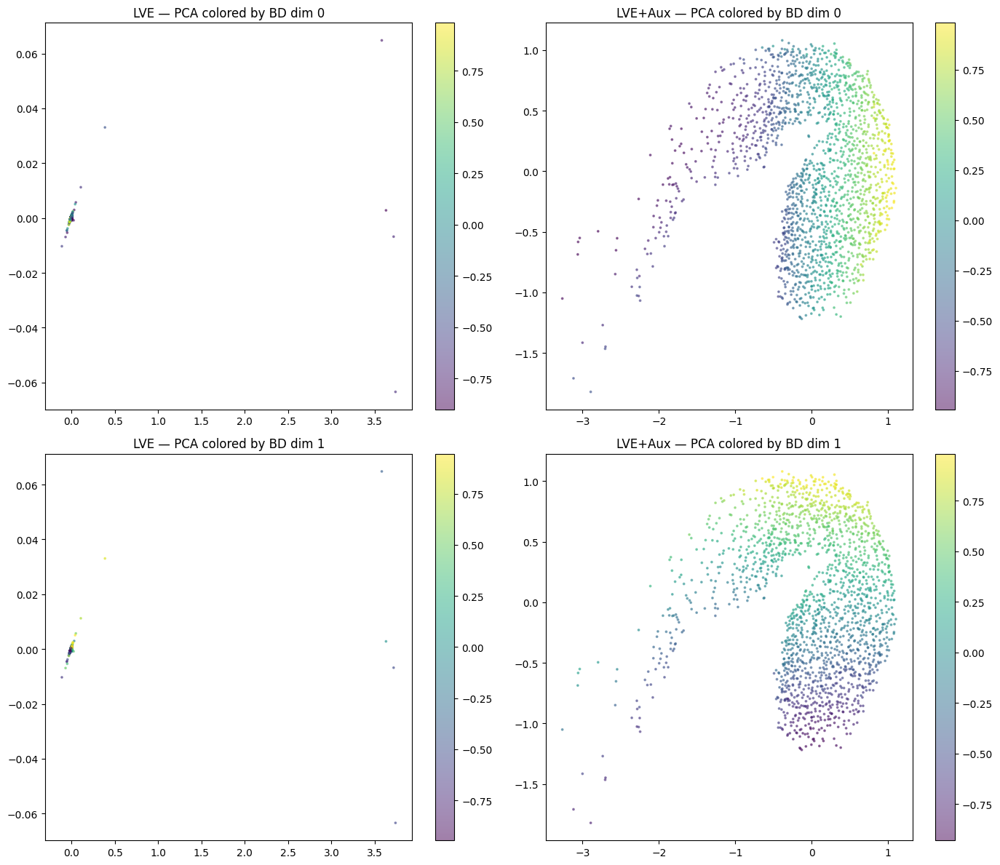


--- t-SNE ---


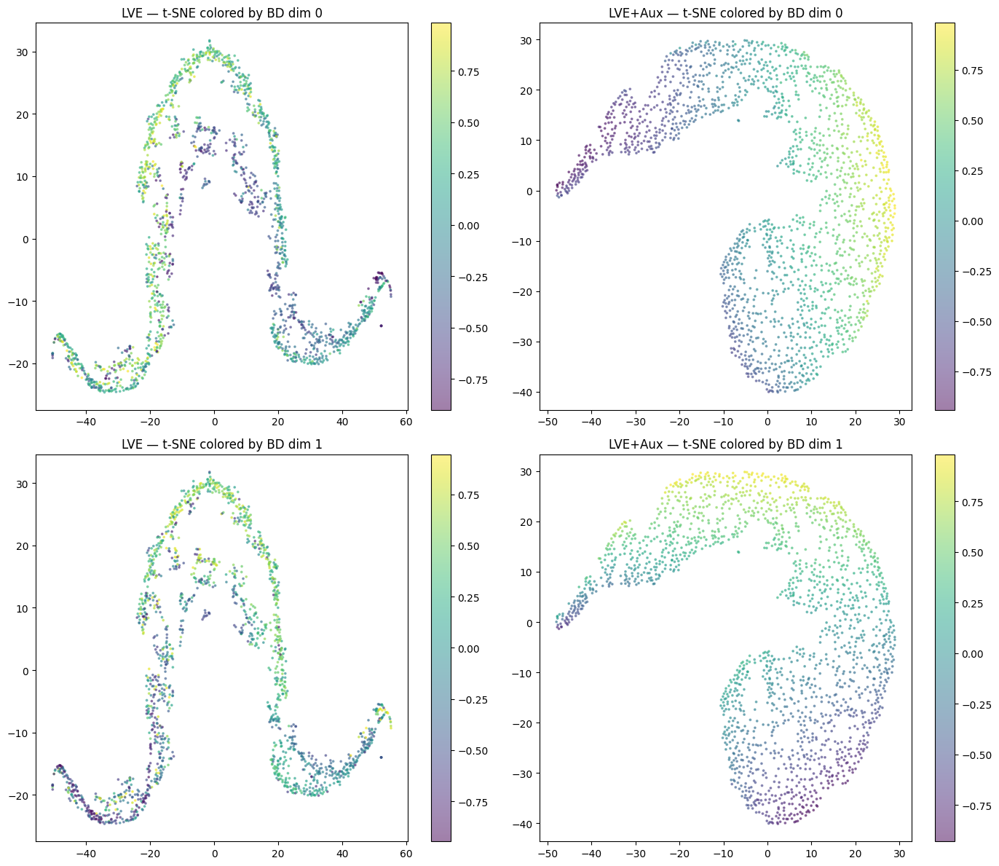


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


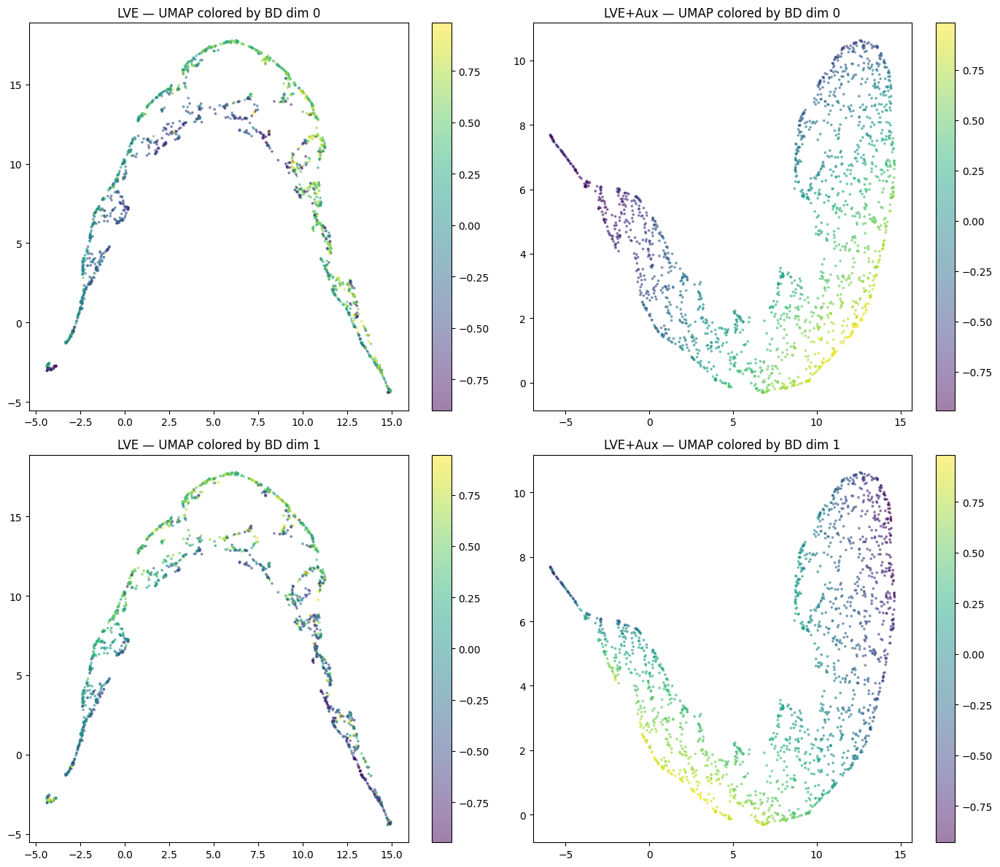

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 5239 entries, latent dim 32
LVE+Aux: 5292 entries, latent dim 32

--- PCA ---


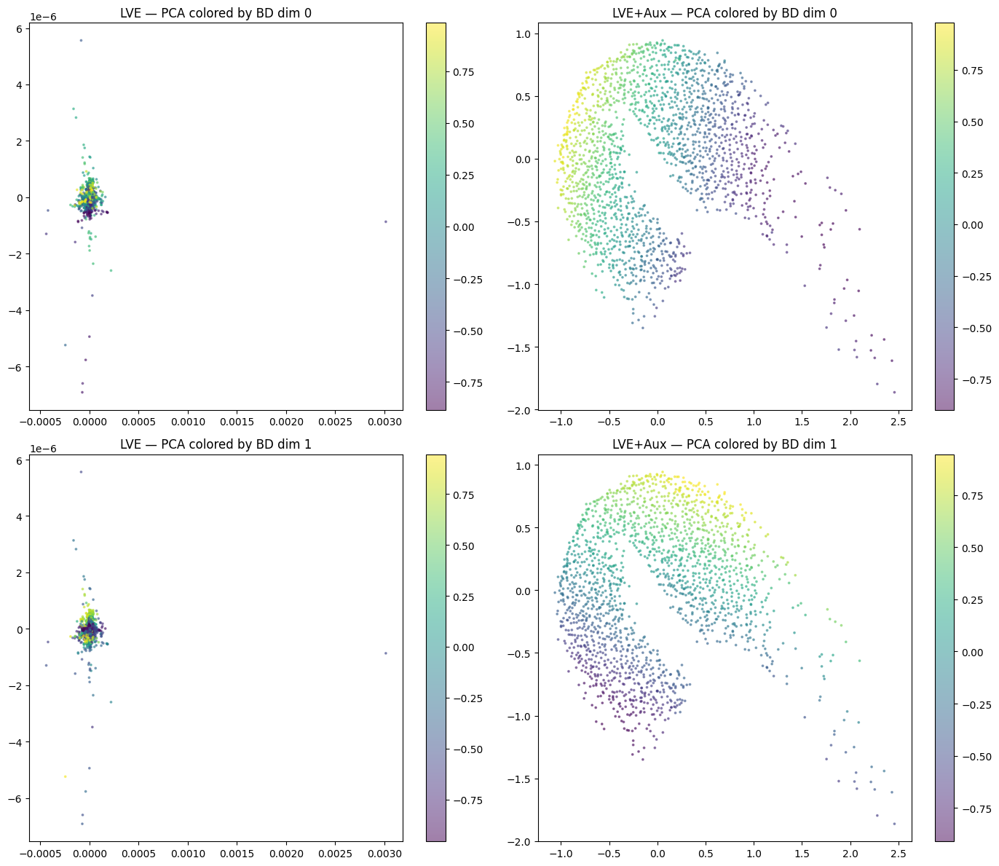


--- t-SNE ---


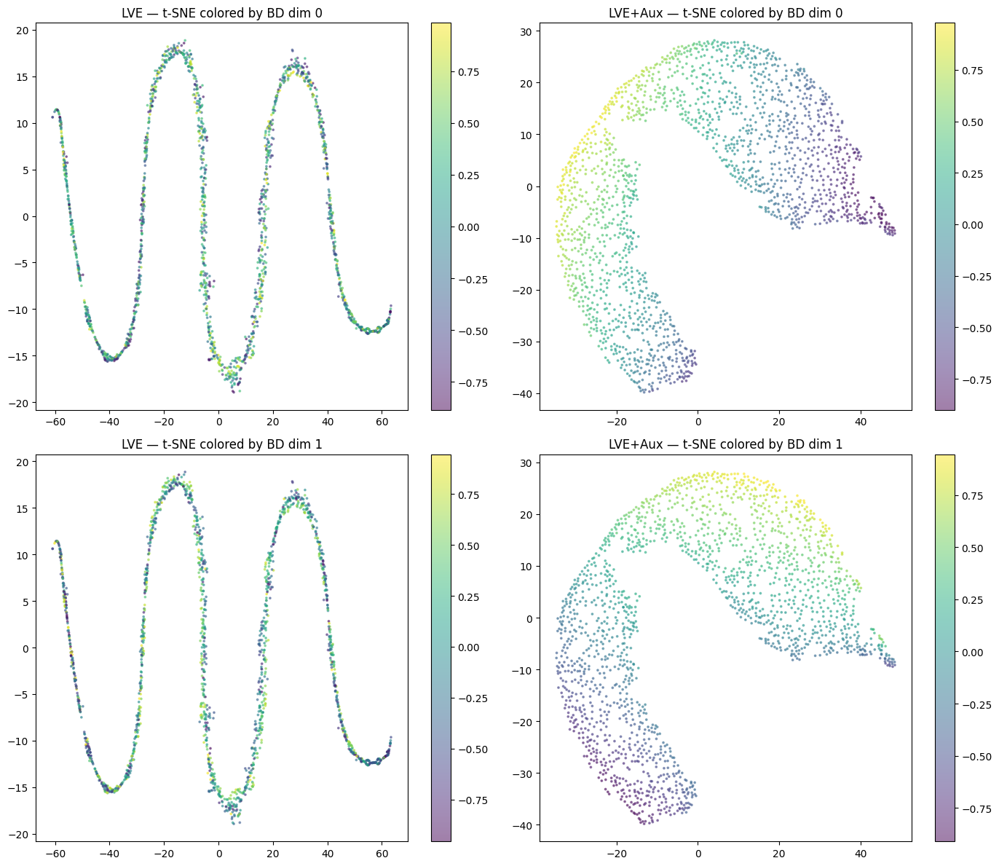


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


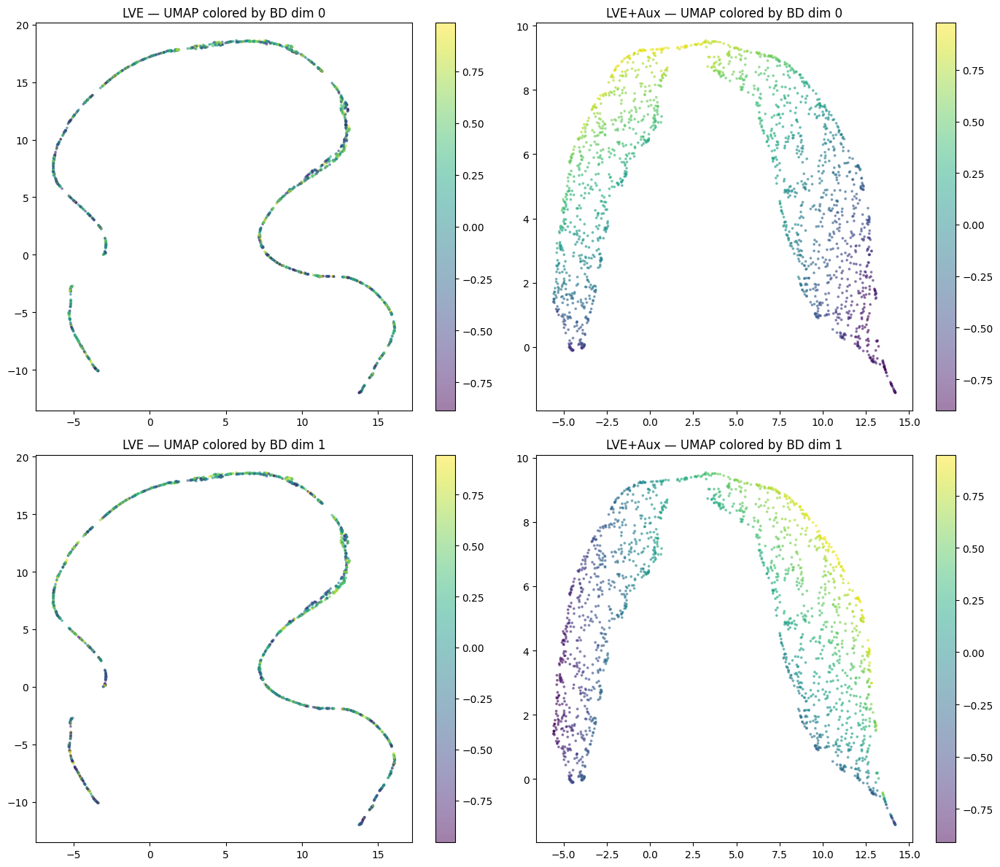

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 3881 entries, latent dim 32
LVE+Aux: 4230 entries, latent dim 32

--- PCA ---


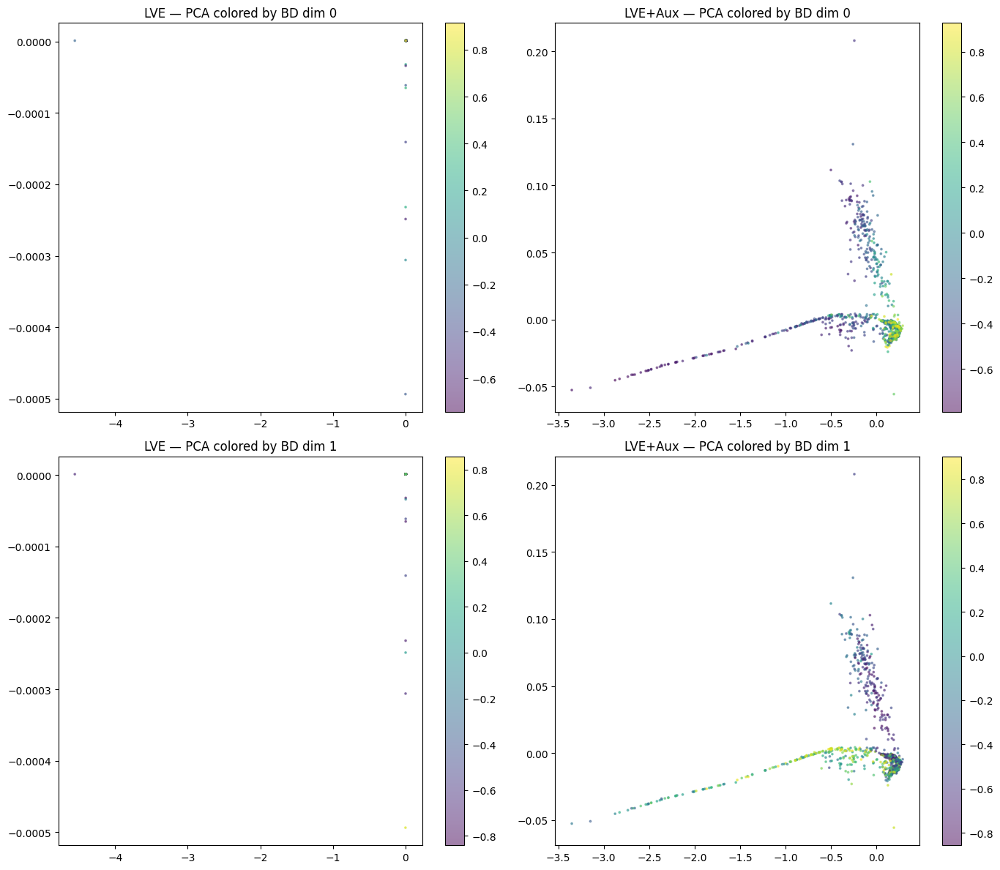


--- t-SNE ---


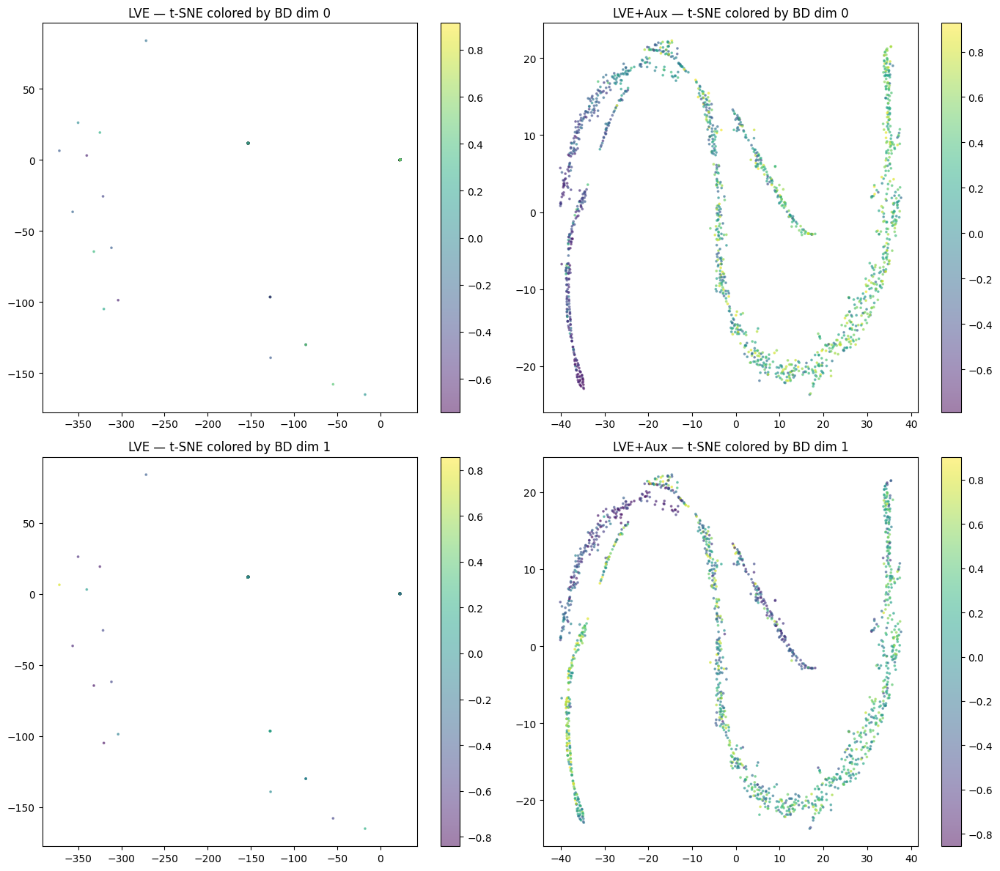


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


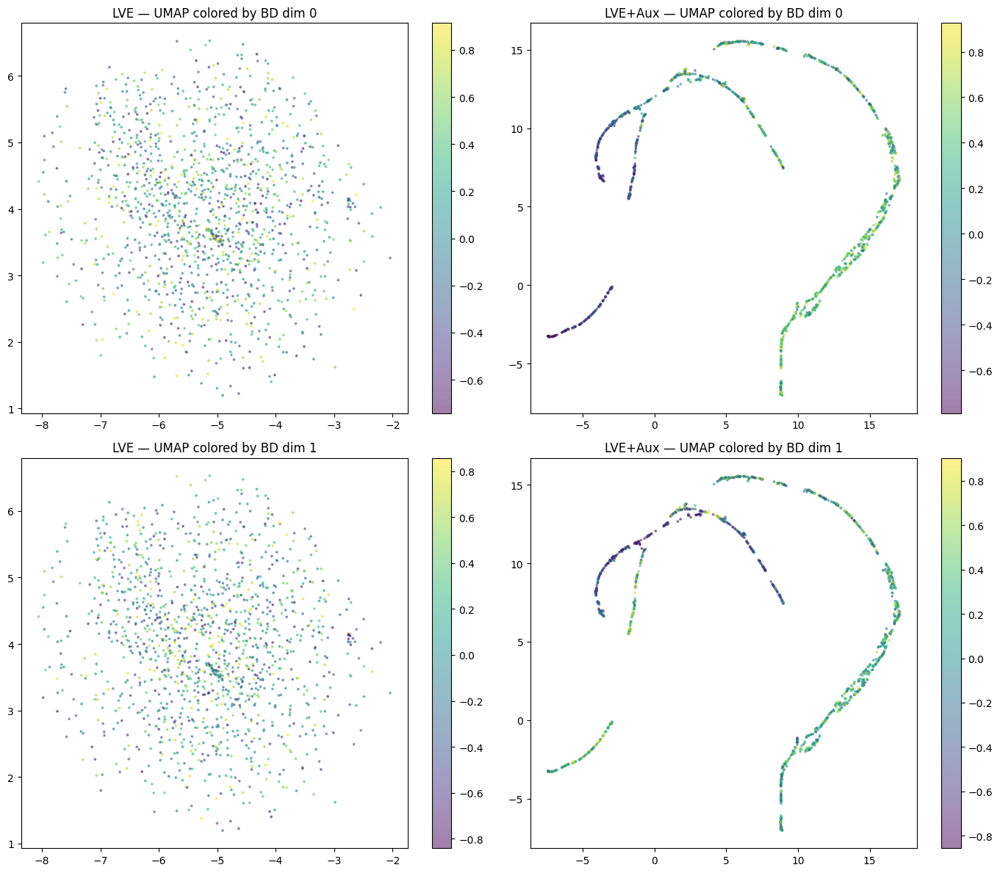

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 4126 entries, latent dim 32
LVE+Aux: 4352 entries, latent dim 32

--- PCA ---


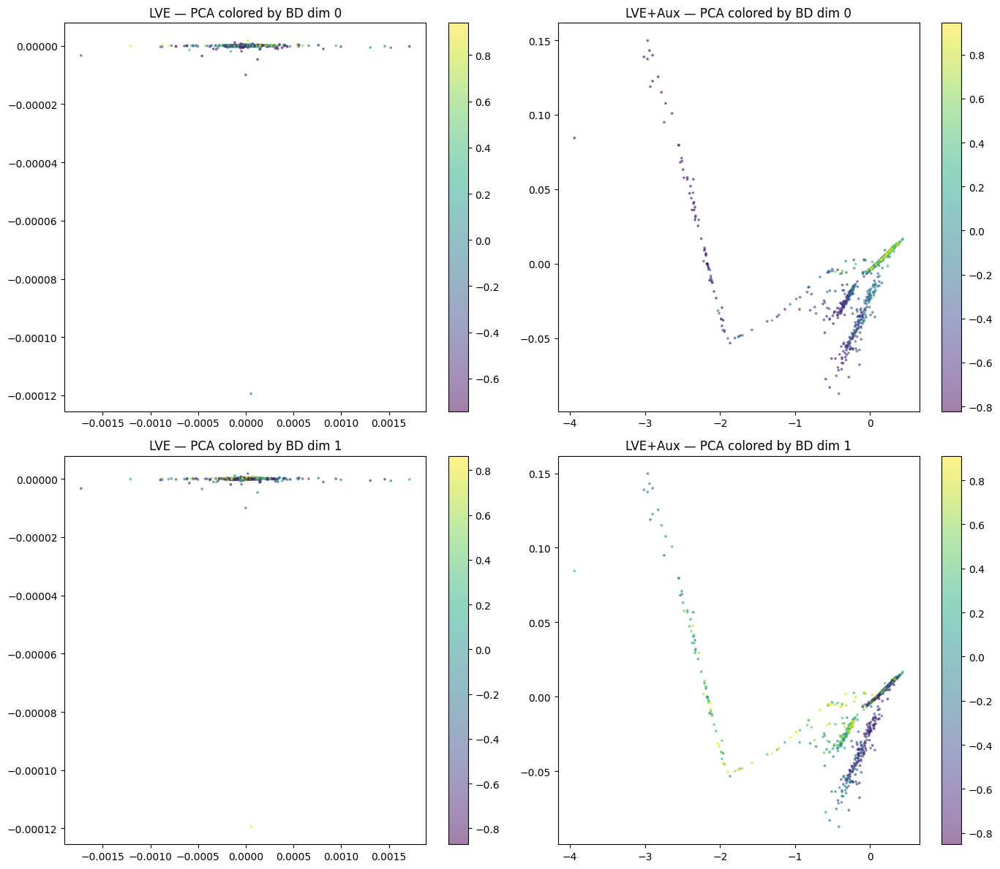


--- t-SNE ---


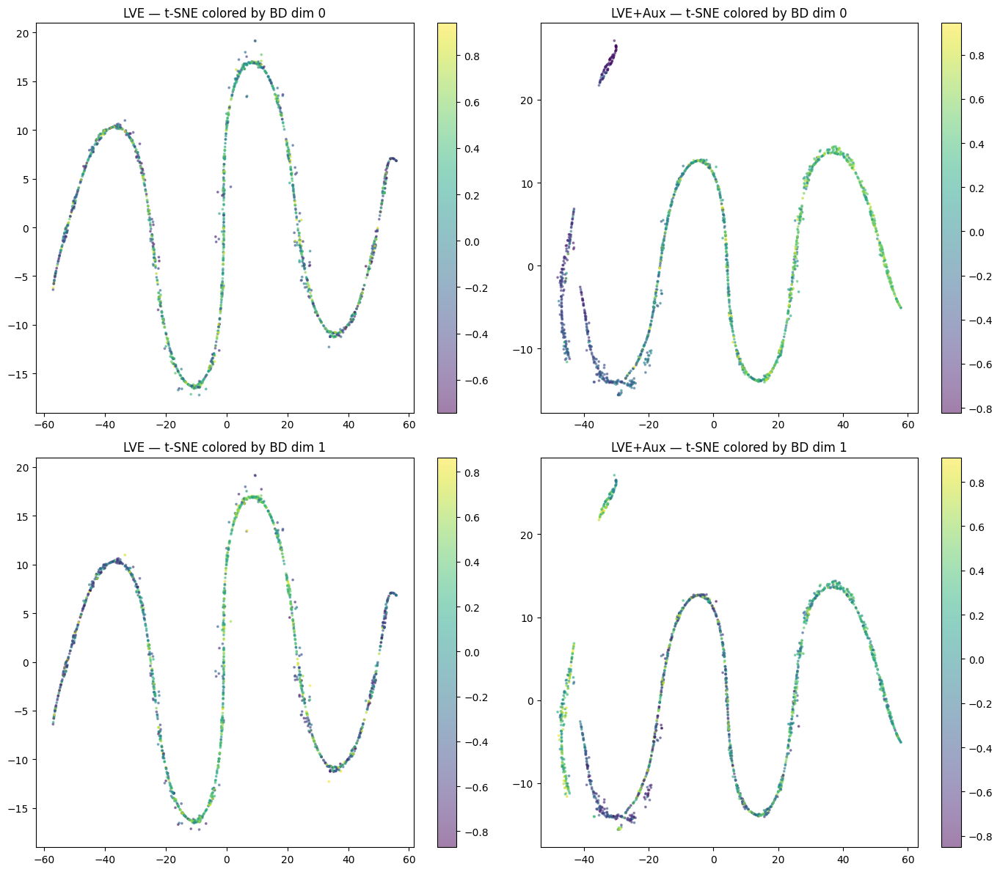


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


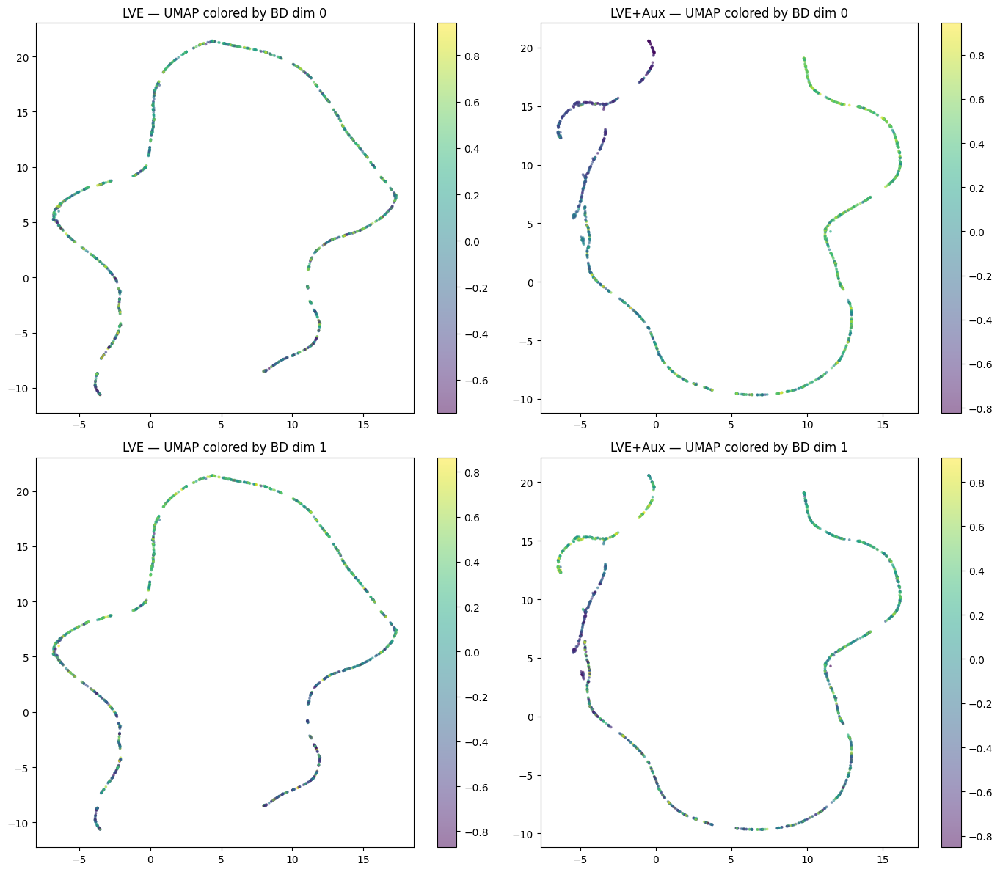

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 5236 entries, latent dim 32
LVE+Aux: 5175 entries, latent dim 32

--- PCA ---


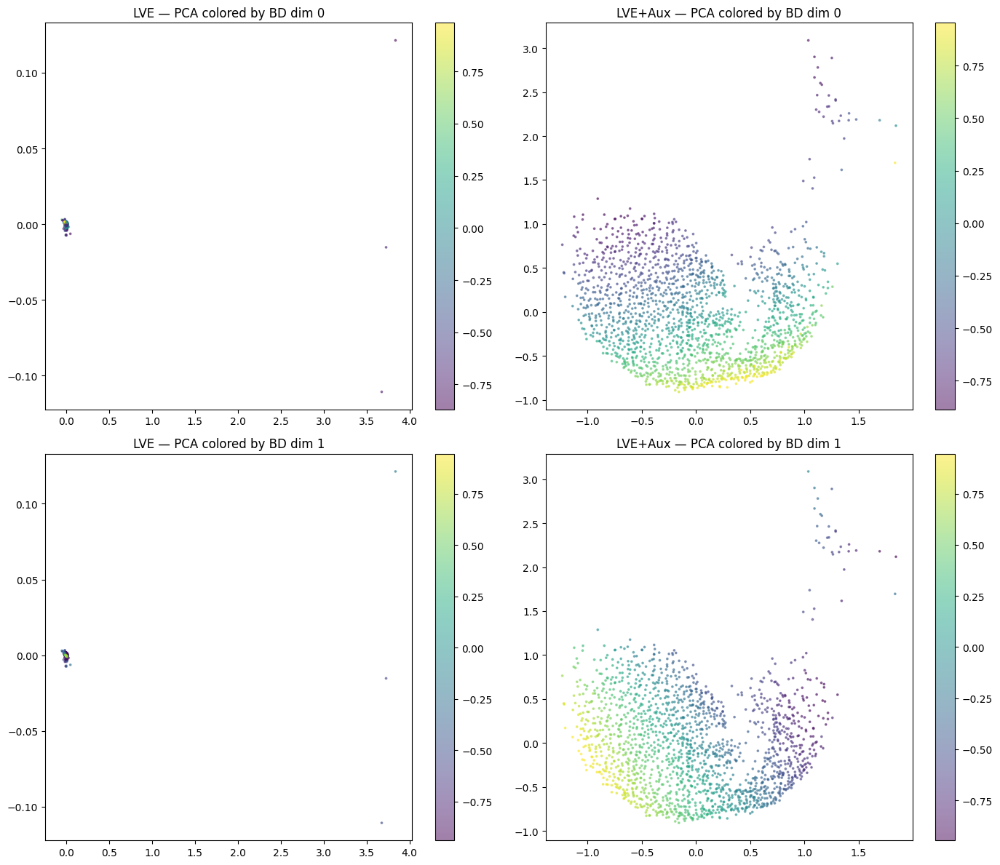


--- t-SNE ---


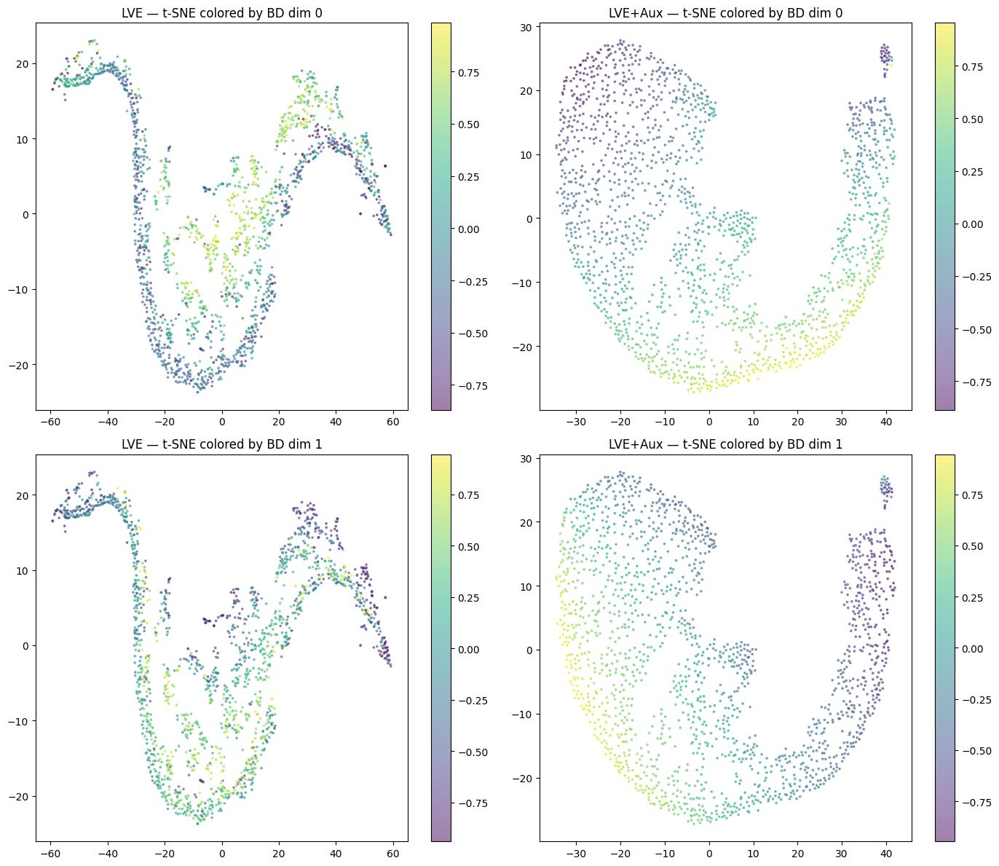


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


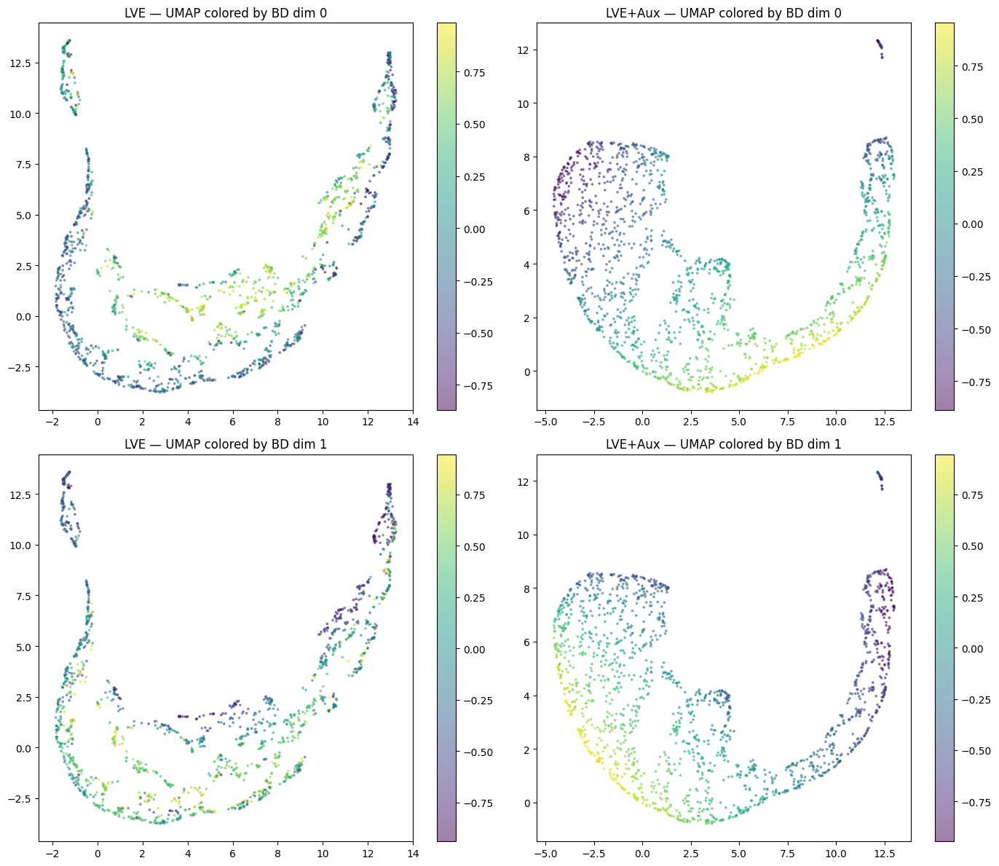

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 5272 entries, latent dim 32
LVE+Aux: 5267 entries, latent dim 32

--- PCA ---


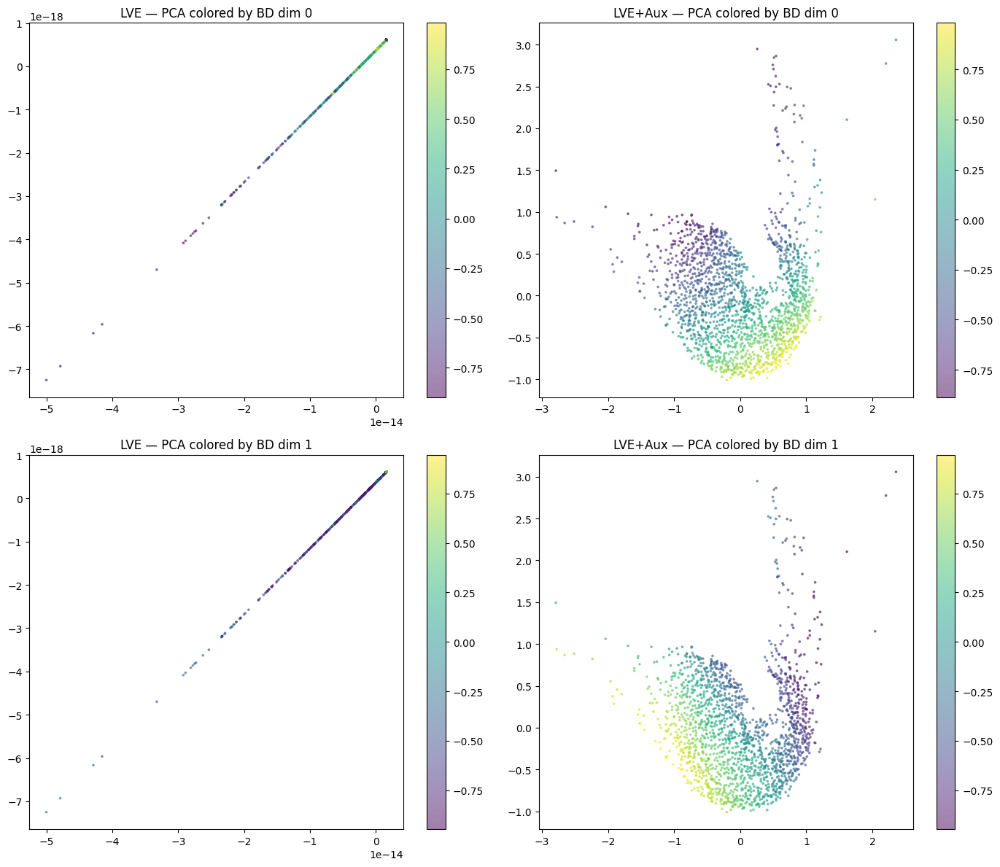


--- t-SNE ---


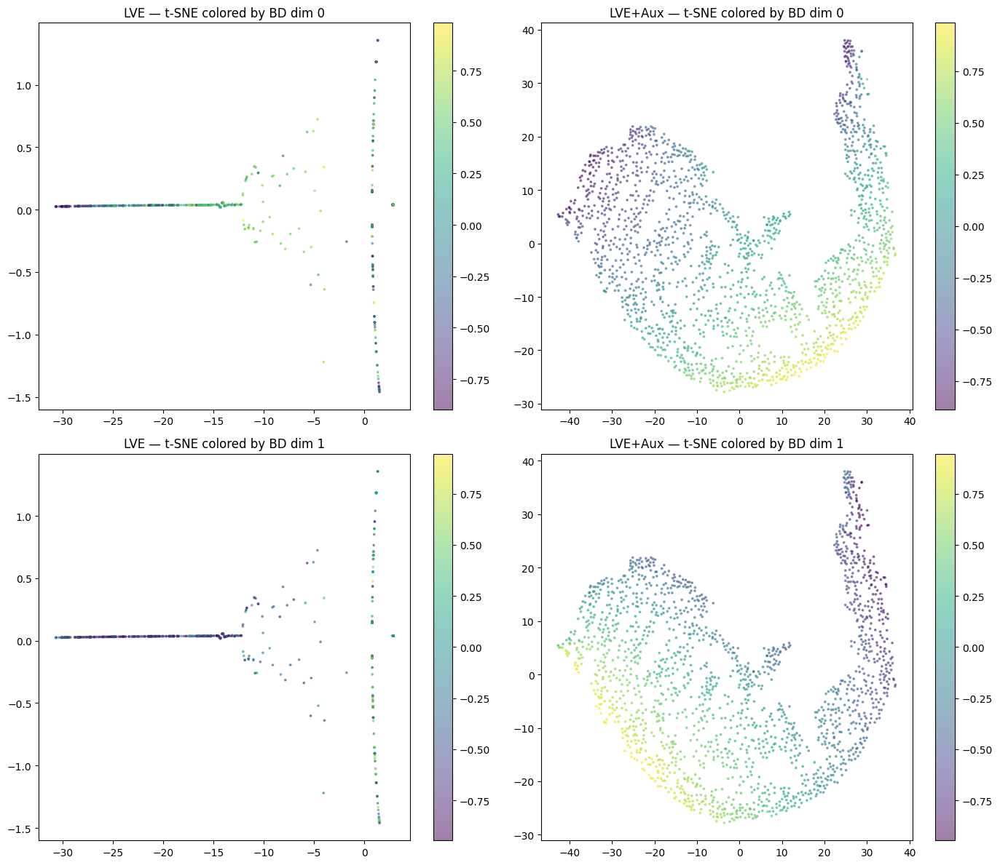


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


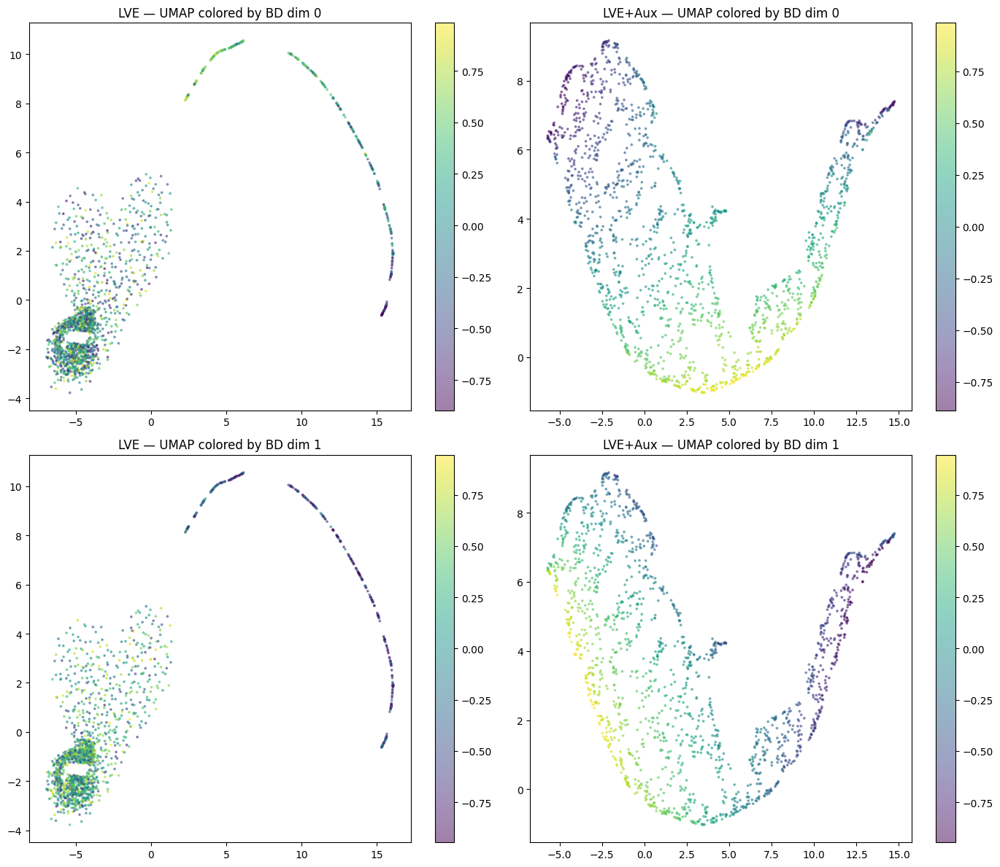

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 4062 entries, latent dim 32
LVE+Aux: 4132 entries, latent dim 32

--- PCA ---


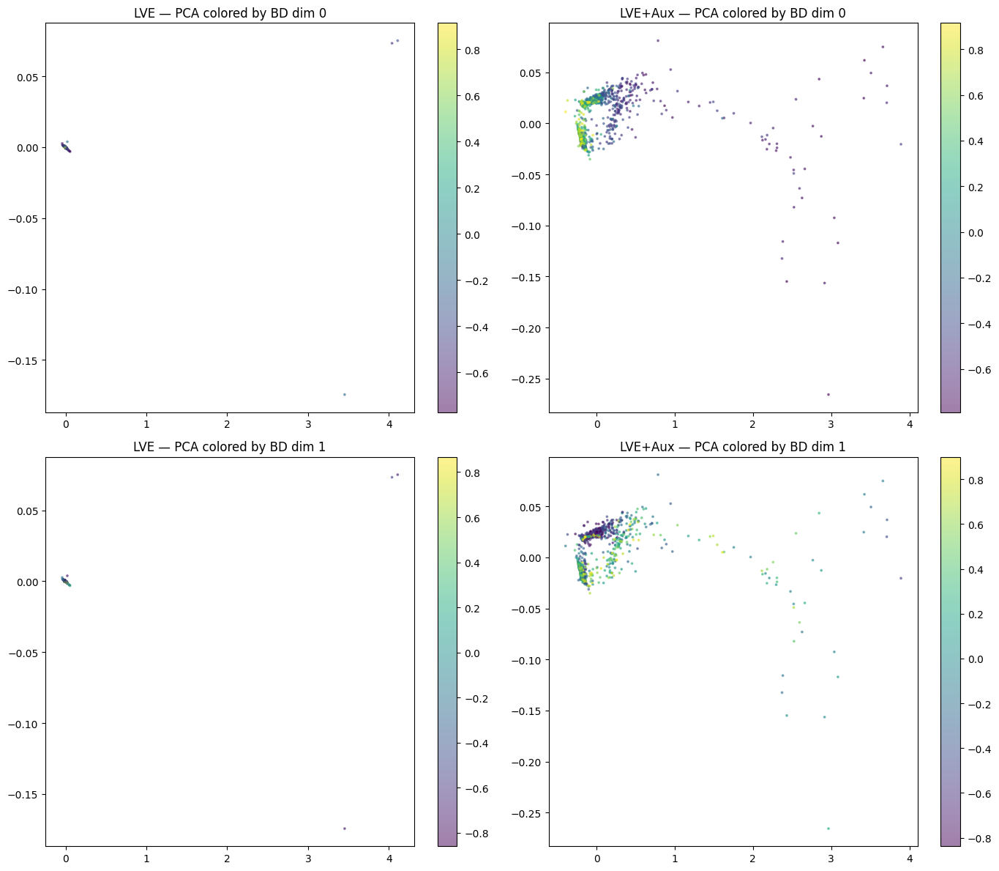


--- t-SNE ---


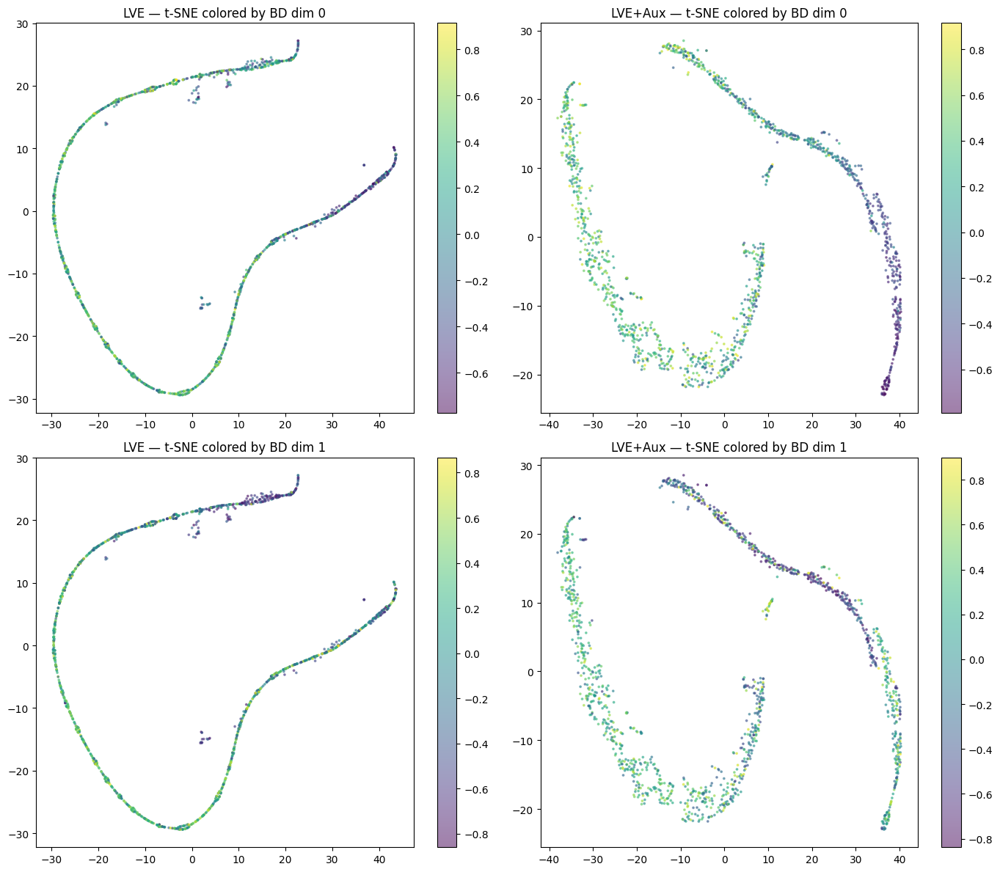


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


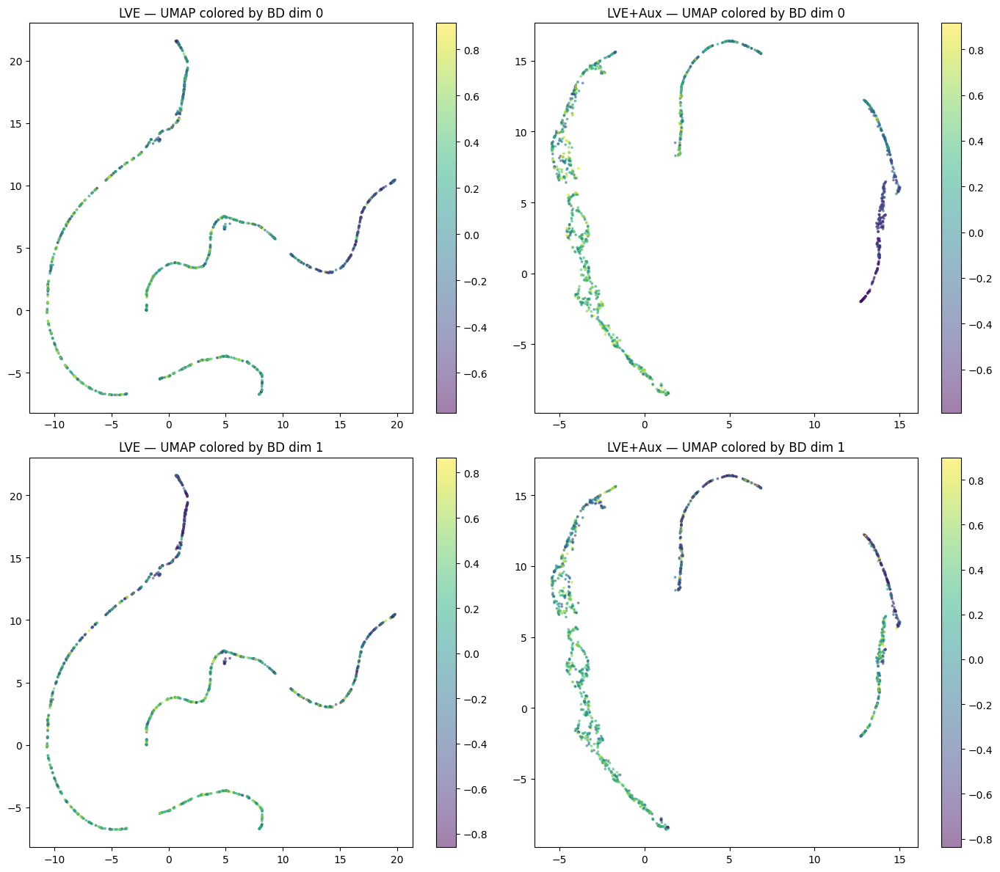

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 4192 entries, latent dim 32
LVE+Aux: 4011 entries, latent dim 32

--- PCA ---


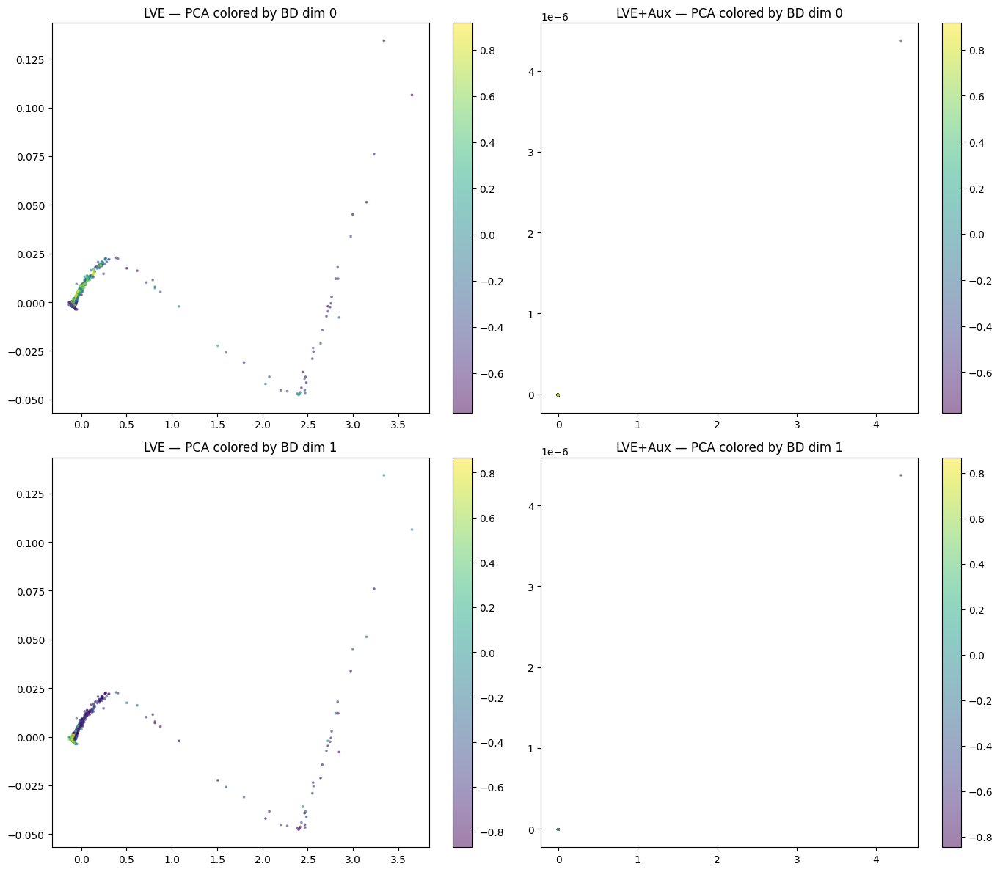


--- t-SNE ---


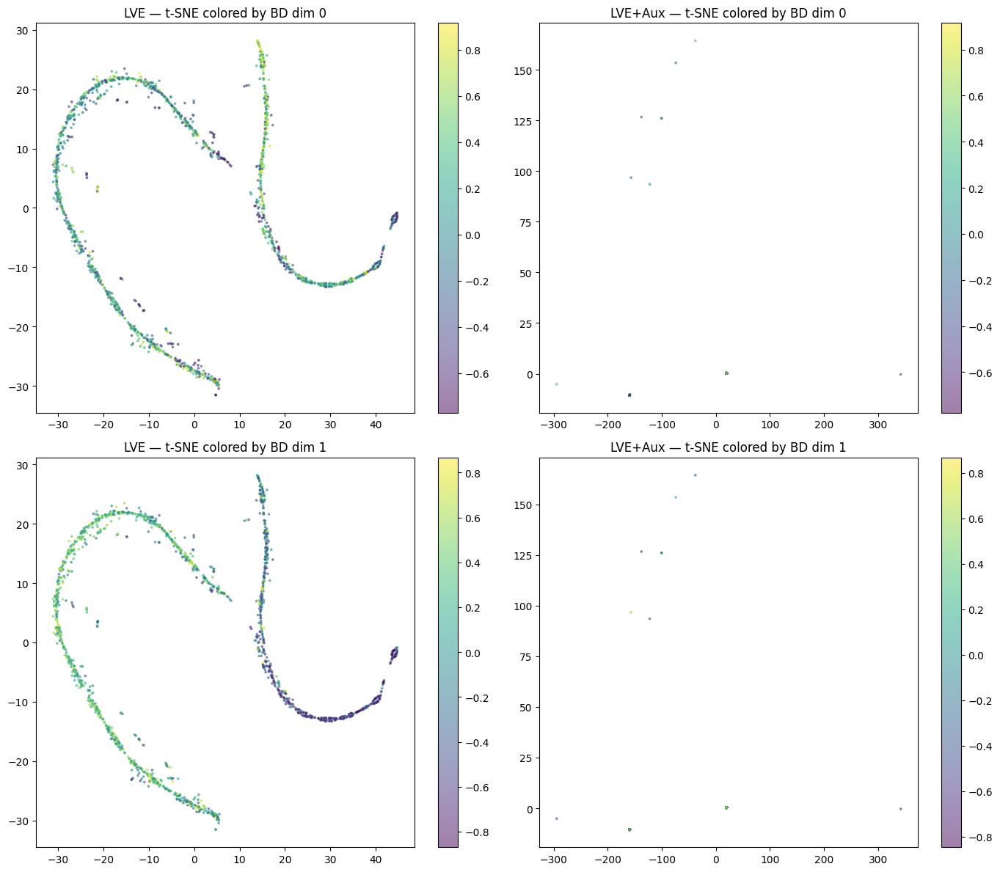


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


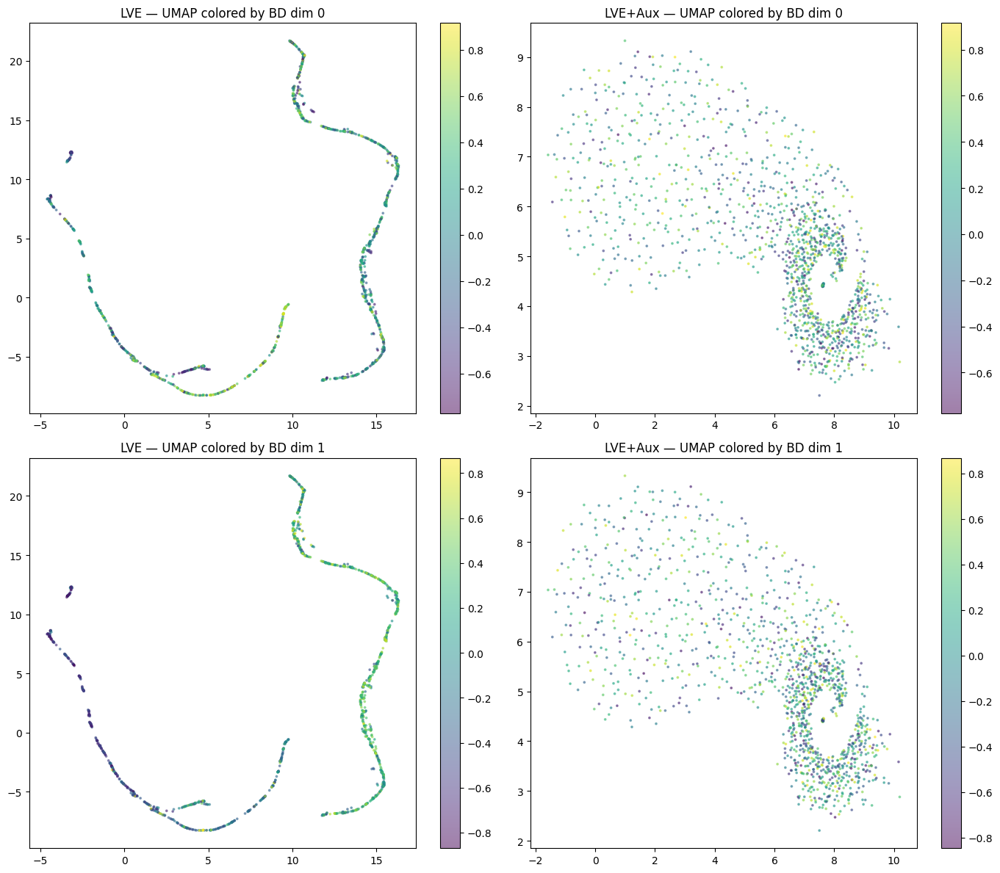

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 5238 entries, latent dim 32
LVE+Aux: 5276 entries, latent dim 32

--- PCA ---


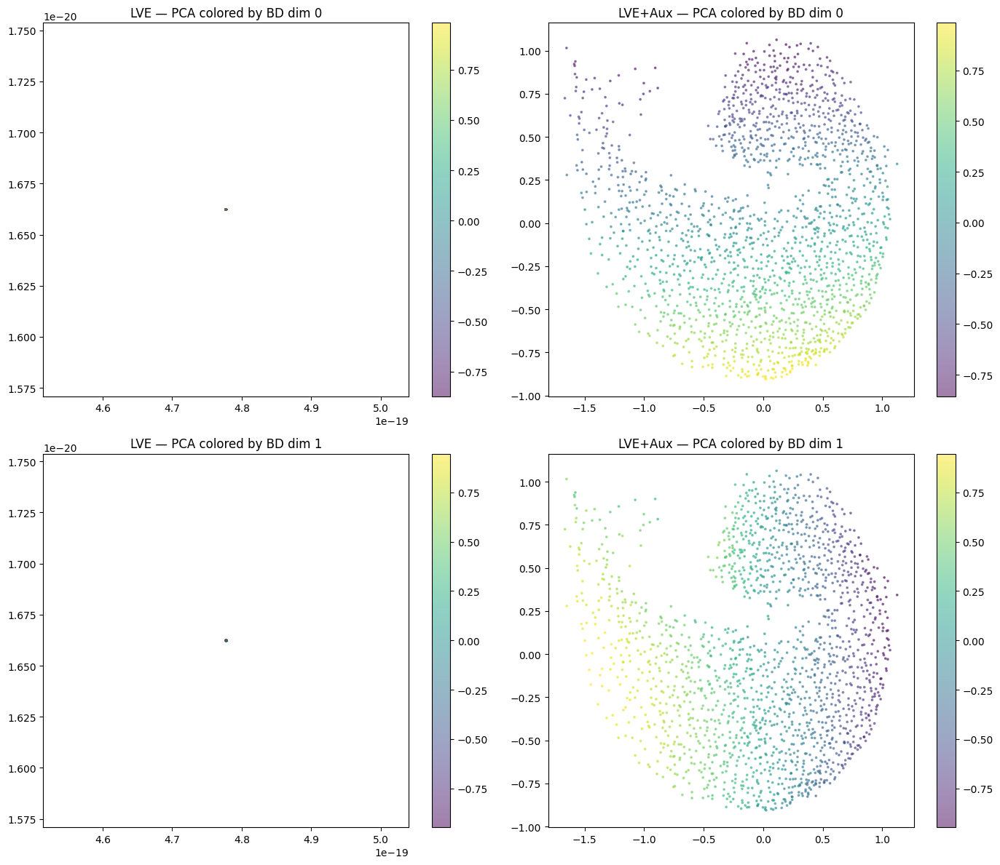


--- t-SNE ---


In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 5205 entries, latent dim 32
LVE+Aux: 5289 entries, latent dim 32

--- PCA ---


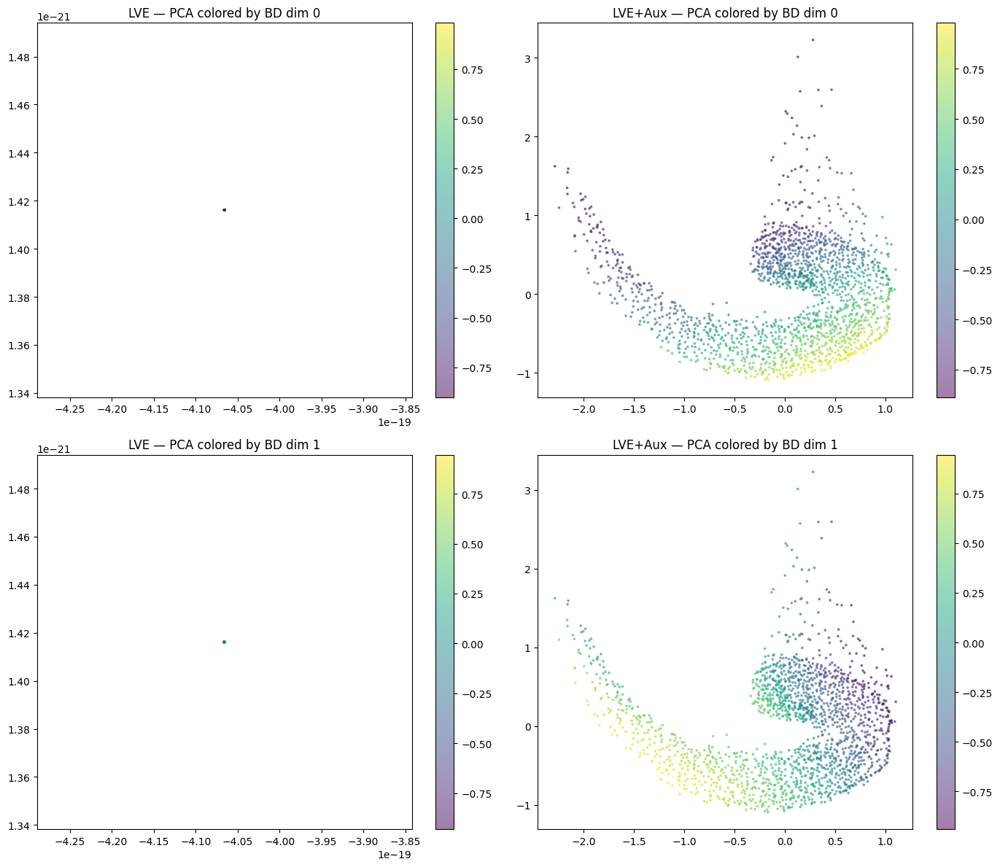


--- t-SNE ---


In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 4062 entries, latent dim 32
LVE+Aux: 4132 entries, latent dim 32

--- PCA ---


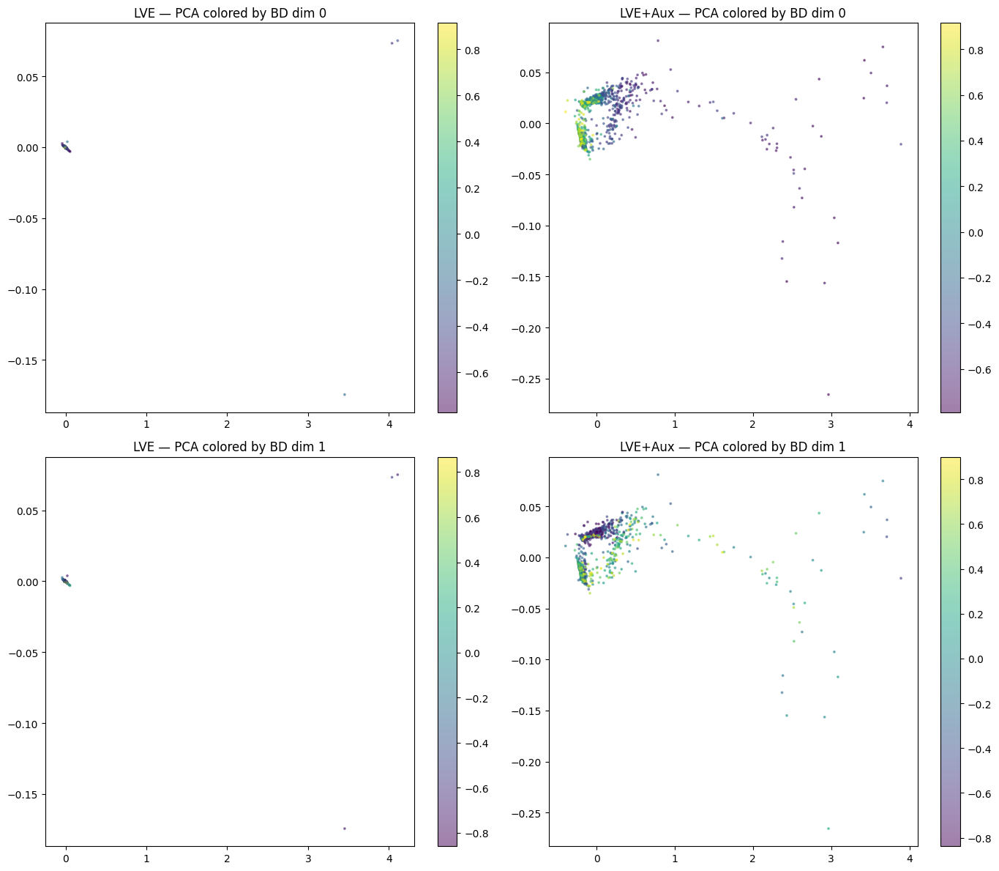


--- t-SNE ---


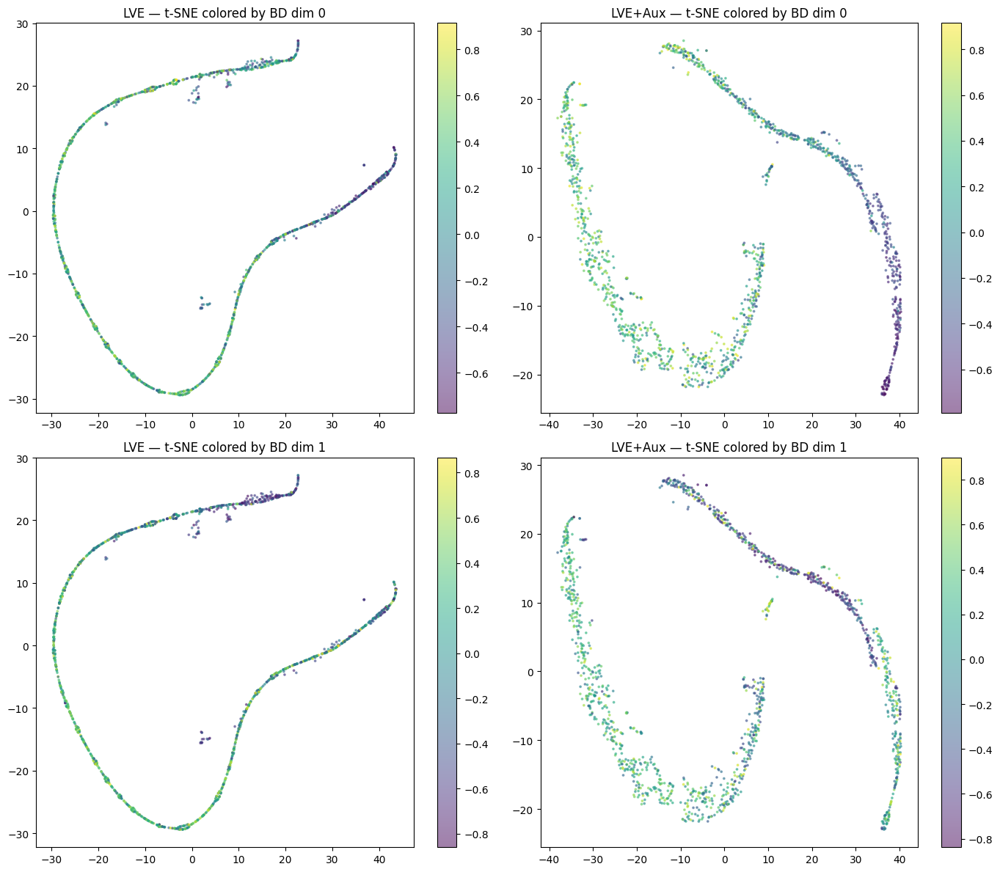


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


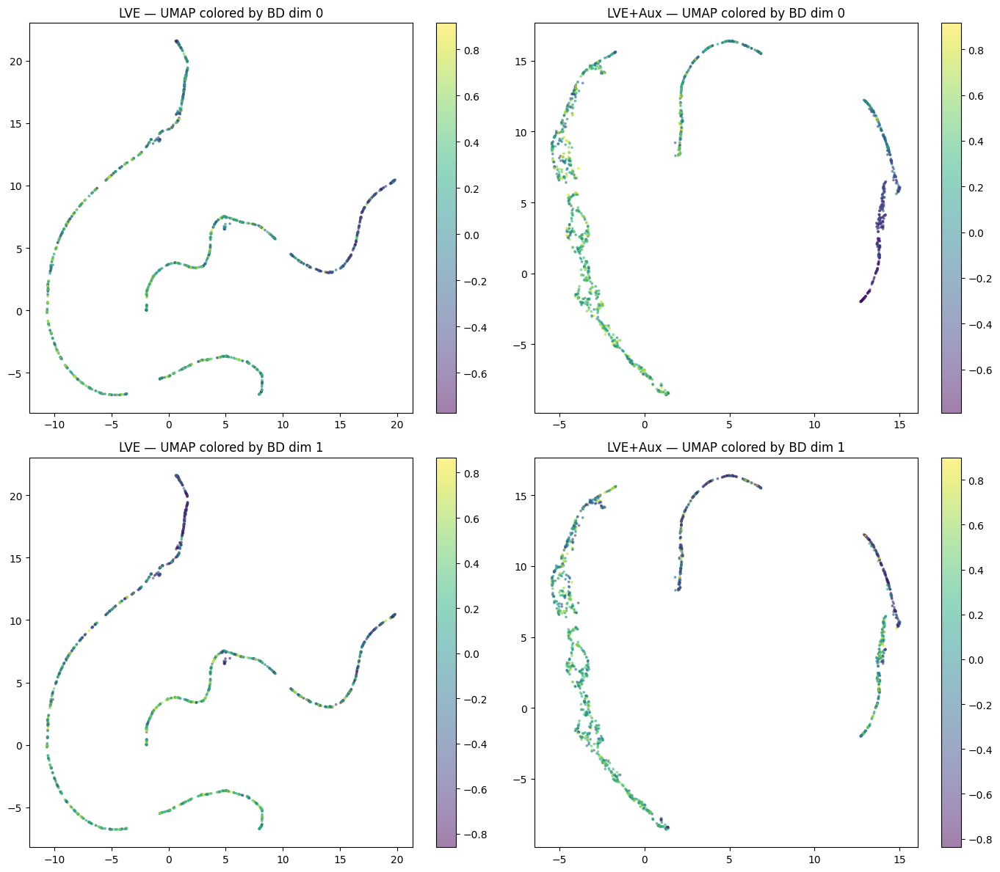

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

LVE: 4085 entries, latent dim 32
LVE+Aux: 4160 entries, latent dim 32

--- PCA ---


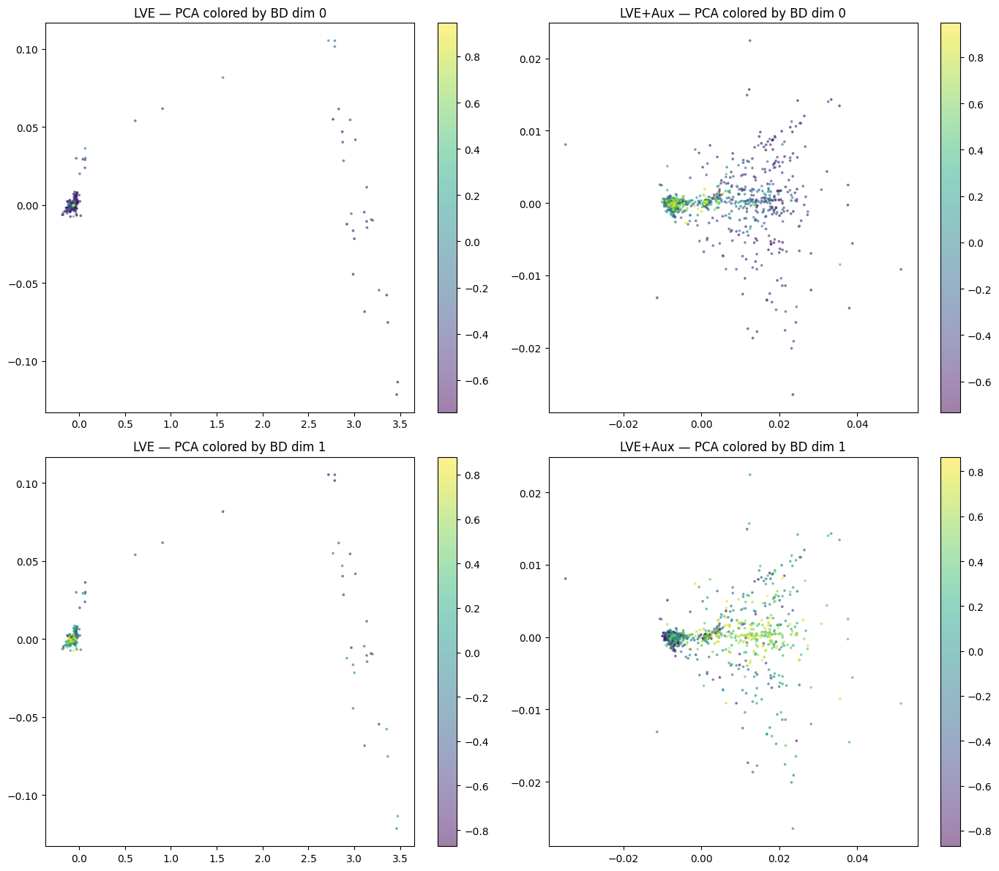


--- t-SNE ---


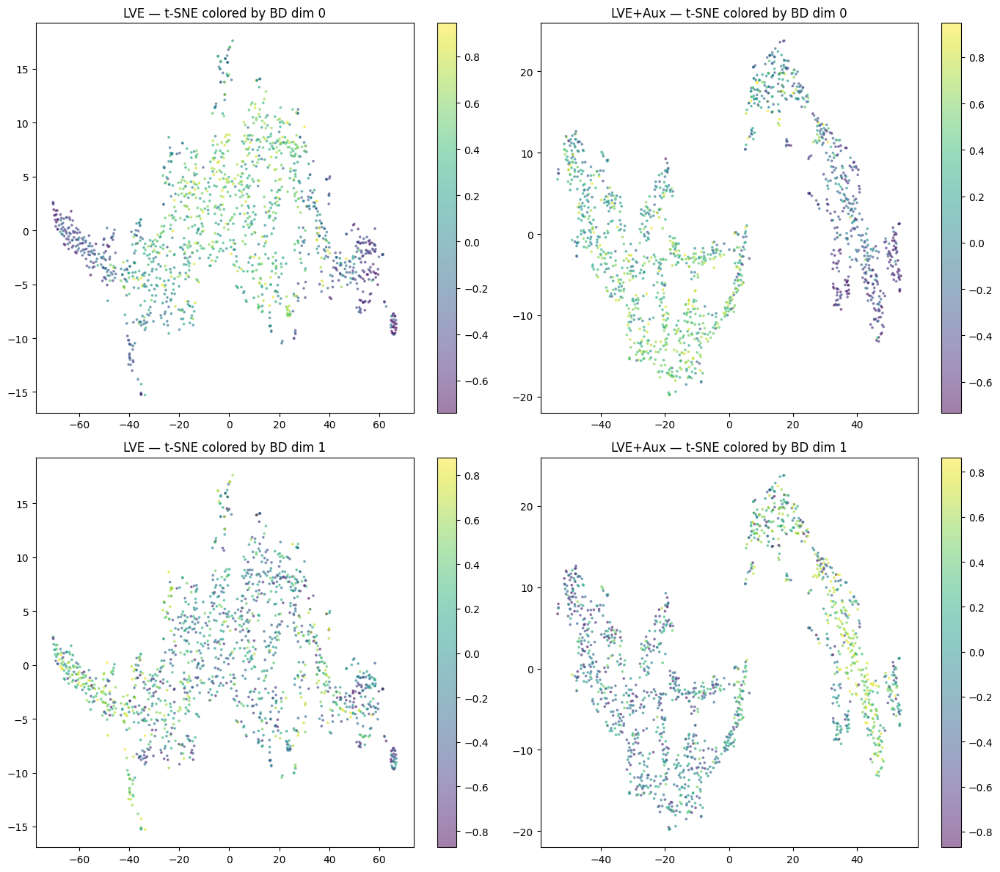


--- UMAP ---


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


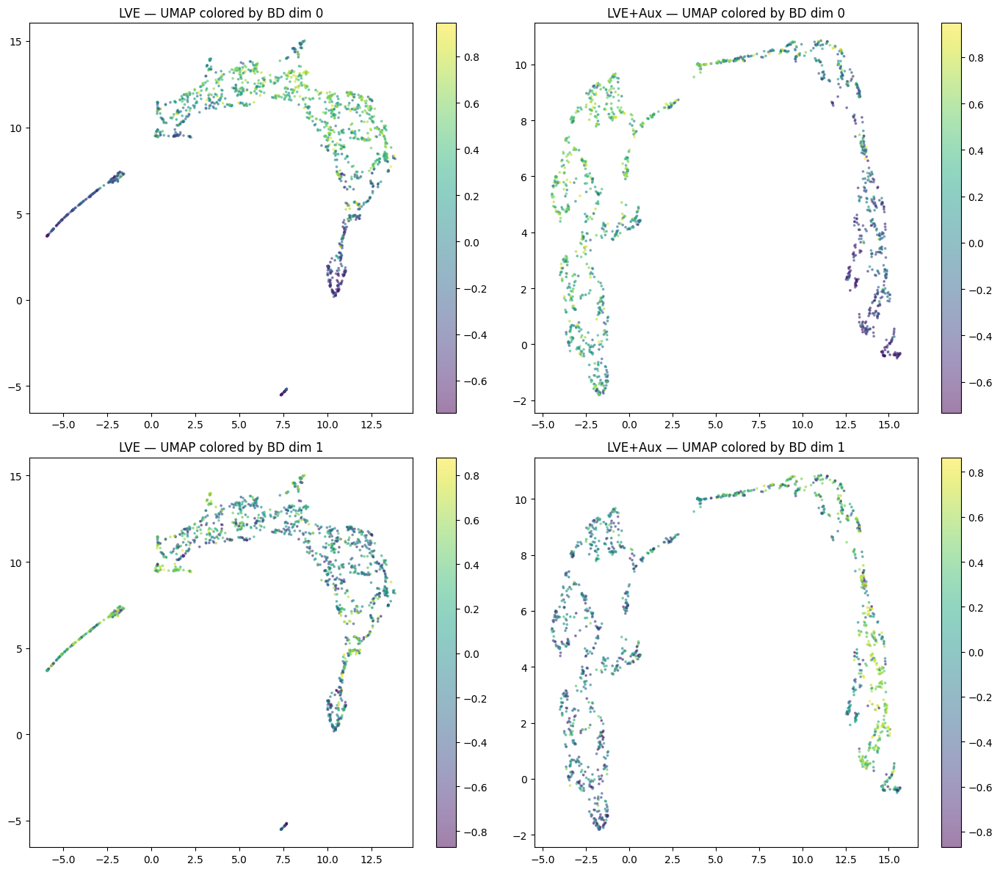

In [ ]:
#@title Latent Space Analysis
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

PATH_A = './'  #@param {type:"string"} # e.g. simple LVE
PATH_B = './'  #@param {type:"string"} # e.g. LVE + aux
LABEL_A = 'LVE'  #@param {type:"string"}
LABEL_B = 'LVE+Aux'  #@param {type:"string"}

N_JOINTS = 1000  #@param {type:"integer"}
END_EFFECTOR_DIM = 2  #@param {type:"integer"}
N_BINS = 1950  #@param {type:"integer"}
CENTERS = "Precomputed_CVT_1950"  #@param {type:"string"}

LATENT_DIM_A = 32  #@param {type:"integer"}
HIDDEN_DIMS_A = [128]  #@param
LATENT_DIM_B = 32  #@param {type:"integer"}
HIDDEN_DIMS_B = [128]  #@param

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

GENE_DIM = N_JOINTS * (END_EFFECTOR_DIM - 1)
bd = PlanarArmBD_CVT(n_bins=N_BINS, centers=CENTERS, bd_dim=END_EFFECTOR_DIM)

def load_model_and_archive(path, latent_dim, hidden_dims):
    lm = BaseBetaVAE(input_dim=GENE_DIM, latent_dim=latent_dim, hidden_dims=hidden_dims)
    bm = MAPElitesBM(behavior_descriptor=bd, fitness_fn=lambda info: 0, top_k=3)
    data = np.load(path + 'bm_data.npz', allow_pickle=True)
    dataset = list(data['dataset'])
    fitnesses = list(data['fitnesses'])
    bin_ids = list(data['bin_ids'])
    bm.bins = {}
    for theta, fitness, bid in zip(dataset, fitnesses, bin_ids):
        bid = tuple(bid) if isinstance(bid, np.ndarray) else bid
        if bid not in bm.bins:
            bm.bins[bid] = []
        bm.bins[bid].append((theta, float(fitness)))
    bm._rebuild()
    lm.load_state_dict(torch.load(path + 'lm.pt', map_location=DEVICE))
    lm.to(DEVICE)
    lm.eval()
    return lm, bm

def encode_archive(lm, bm):
    best = [bm.dataset[bm.bins_idx[bid][0]] for bid in bm.bins_idx]
    data = torch.tensor(np.array(best), dtype=torch.float32).to(DEVICE)
    with torch.no_grad():
        mu = lm.encode(data)
    return mu.cpu().numpy()

def get_bd_values(bm):
    return np.array([bd.bin_value(bid) for bid in bm.bins_idx])

def plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, method_name, project_fn):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
        z2 = project_fn(z)
        for row in range(END_EFFECTOR_DIM):
            ax = axes[row, col]
            sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_vals[:, row], cmap='viridis', s=3, alpha=0.5)
            ax.set_title(f"{label} — {method_name} colored by BD dim {row}")
            plt.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()
    plt.close()

lm_a, bm_a = load_model_and_archive(PATH_A, LATENT_DIM_A, HIDDEN_DIMS_A)
lm_b, bm_b = load_model_and_archive(PATH_B, LATENT_DIM_B, HIDDEN_DIMS_B)

z_a = encode_archive(lm_a, bm_a)
z_b = encode_archive(lm_b, bm_b)

bd_vals_a = get_bd_values(bm_a)
bd_vals_b = get_bd_values(bm_b)

print(f"{LABEL_A}: {len(bm_a.dataset)} entries, latent dim {LATENT_DIM_A}")
print(f"{LABEL_B}: {len(bm_b.dataset)} entries, latent dim {LATENT_DIM_B}")

print("\n--- PCA ---")
plot_projections(z_a, z_b, bd_vals_a, bd_vals_b, "PCA",
                 lambda z: PCA(n_components=2).fit_transform(z))

print("\n--- t-SNE ---")
def tsne_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    z2 = TSNE(n_components=2, perplexity=50, random_state=42).fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = tsne_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — t-SNE colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()

print("\n--- UMAP ---")
def umap_project(z):
    n = min(len(z), 5000)
    idx = np.random.choice(len(z), n, replace=False)
    reducer = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
    z2 = reducer.fit_transform(z[idx])
    return z2, idx

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for col, (z, bd_vals, label) in enumerate([(z_a, bd_vals_a, LABEL_A), (z_b, bd_vals_b, LABEL_B)]):
    z2, idx = umap_project(z)
    bd_sub = bd_vals[idx]
    for row in range(END_EFFECTOR_DIM):
        ax = axes[row, col]
        sc = ax.scatter(z2[:, 0], z2[:, 1], c=bd_sub[:, row], cmap='viridis', s=3, alpha=0.5)
        ax.set_title(f"{label} — UMAP colored by BD dim {row}")
        plt.colorbar(sc, ax=ax)
plt.tight_layout()
plt.show()
plt.close()